<a href="https://colab.research.google.com/github/jennahsuan/Big5-Project/blob/main/big5_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[Github](https://github.com/jennahsuan/Big5-Project.git)

✅ test learning rate, batch size : use 1e-5, 8 

In [ ]:
!nvidia-smi

Thu Nov 24 06:36:45 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   74C    P0    30W /  70W |   6426MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
torch.cuda.empty_cache()

None


### extract folder
⛔

In [ ]:
import zipfile
root = '/content/drive/MyDrive/IM_project/dlib_testing/Big5/'
# path = root+'test_clips/test80_0'
# for i in range(1,10):
#   zipfolder = path +str(i)+ '.zip'
#   with zipfile.ZipFile(zipfolder, 'r') as zip_ref:
#     zip_ref.extractall(root+'test_clips/test80_0'+str(i), pwd=".chalearnLAPFirstImpressionsSECONDRoundICPRWorkshop2016.".encode("utf-8") )
#   print(i)
# path = root+'zip_train/training80_'
# for i in range(14,76):
#   zipfolder = path +str(i)+ '.zip'
#   with zipfile.ZipFile(zipfolder, 'r') as zip_ref:
#     zip_ref.extractall(root+'train13')  
#   print(i)

In [ ]:
# for i in range(2,7):
#   with zipfile.ZipFile(root+'train-'+str(i)+'.zip', 'r') as zip_ref:
#       zip_ref.extractall(root+'zip_train')
# with zipfile.ZipFile(root+'test-2e.zip', 'r') as zip_ref:
    # zip_ref.extractall(root+'test/', pwd="zeAzLQN7DnSIexQukc9W".encode("utf-8"))

In [ ]:
# import shutil
# import os
    
# source_dir = root+'test_clips/test80_0'
# target_dir = root+'test/'
# for i in range(4, 26):
#   source_dir = root+'test_clips/test80_0'+str(i)+'/'
#   file_names = os.listdir(source_dir)
      
#   for file_name in file_names:
#       # print(os.path.join(source_dir, file_name))
#       shutil.move(os.path.join(source_dir, file_name), target_dir)
#   print(len(os.listdir(target_dir)))


### Packages *

In [ ]:
!fusermount -u drive
!google-drive-ocamlfuse drive

fusermount: failed to unmount /content/drive: No such file or directory
/bin/bash: google-drive-ocamlfuse: command not found


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
%config IPCompleter.greedy=True
# !pip install torch torchvision
# !pip install tensorboard
!pip install torchinfo
!pip3 install pickle5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 132 kB 14.0 MB/s 
  Created wheel for pickle5: filename=pickle5-0.0.11-cp38-cp38-linux_x86_64.whl size=236296 sha256=e563afa9191332ae53622039664a5b539eedc10ee513e65cf01cd2fc39206b24
  Stored in directory: /root/.cache/pip/wheels/25/d4/61/dbd8edd1a0d656be7b4267c85db3b61951eb60016a0154a122
Successfully built pickle5


In [ ]:
import librosa
import librosa.display
import numpy as np
import pandas as pd

import os
from typing import List, Tuple, Dict
import matplotlib.pyplot as plt
import random
import cv2
import pickle5 as pickle
import datetime

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import datasets
from torchvision.transforms import ToTensor, Compose
import torchvision.transforms as tf
from torch.utils.tensorboard import SummaryWriter
from torchinfo import summary


# below line of code is used only in colab
from google.colab.patches import cv2_imshow
from tqdm.auto import tqdm

### configuration *
define own folder directory and basic settings

In [ ]:
root = '/content/drive/MyDrive/IM_project/dlib_testing/Big5/'
if not os.path.isdir(root):
  raise ValueError("dir does not exist")
  
'''DEFAULT'''
big5_name = ['extraversion', 'neuroticism', 'agreeableness', 'conscientiousness', 'openness']

In [ ]:
from google.colab import auth
import gspread
from google.auth import default
#autenticating to google
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)

In [ ]:
# worksheet = gc.open('/content/drive/MyDrive/IMP 實驗/IMP實驗受試者招募表單 (回覆)').sheet2
test_google = gc.open_by_key('1OUwSjPBnWo32mL_wwJ979yDTpbwFd8p_TemuRgb295s')
test_googlept2 = test_google.worksheet('sheet2')

rows = test_googlept2.get_all_values()
df_exp = pd.DataFrame(data = rows[1:], columns = rows[0])
df_exp.head()

,id,name,count,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Openess
0,1,游孟純,3,0.58,0.46,0.78,0.66,0.74
1,2,吳謹妤,3,0.78,0.32,0.7,0.64,0.7
2,3,陳涵,3,0.82,0.34,0.42,0.58,0.8
3,4,任采蓁,3,0.56,0.36,0.68,0.66,0.82
4,5,黃建豪,2,0.66,0.78,0.68,0.64,0.64


In [ ]:
'''train'''
# parameters
audio_modal = False
frame_per_video = 30
batch_size = 8
n_epoch = 160
lr = 1e-5
n_class = 5
imput_size = 256
print_freq = 10
save_model_freq = 10

# use checkpoint or not 
resume = True
resume_path = root + 'checkpoint/1203_6000_resCNN3_scheduler/newest.pkl'

# model information for saving checkpoint and log
date = '1203'
batchsize_lr = str(batch_size) + '_' + str(lr)
note =  '6000_resCNN3_scheduler'

In [ ]:
'''test'''
test_model_name = '1203_6000_resCNN3_scheduler'
test_model_path = root + 'checkpoint/'+ test_model_name +'/best.pkl'

###Helper
functions to extract audio and frames
⛔

In [ ]:
!pip install ffmpeg-python
import ffmpeg as ff
import dlib

!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d /content/shape_predictor_68_face_landmarks.dat.bz2
pretrained_dlib_detector = "/content/shape_predictor_68_face_landmarks.dat"
detector = dlib.get_frontal_face_detector()

In [ ]:
def extract_audio_from_video(file_path: str) -> np.ndarray:
    inputfile = ff.input(file_path)
    out = inputfile.output('-', format='f32le', acodec='pcm_f32le', ac=1, ar='44100')
    raw = out.run(capture_stdout=True)
    del inputfile, out
    return np.frombuffer(raw[0],np.float32)

In [ ]:
def preprocess_audio_series(raw_data: np.ndarray) -> np.ndarray:
    N, M = 24, 1319
    mfcc_data = librosa.feature.mfcc(raw_data, n_mfcc= 24)
    
    #Getting spectral mean (centroid)
    #mean = librosa.feature.spectral_centroid(result)
    
    #Standardizing MFCC (zero mean and unit variance)
    mfcc_data_standardized = (mfcc_data - np.mean(mfcc_data)) / np.std(mfcc_data)
    
    # Use pre-padding (Note: with 0, which is also the mean after standardization) to unify the length of the samples.
    number_of_columns_to_fill = M - mfcc_data_standardized.shape[1]
    padding = np.zeros((N,number_of_columns_to_fill))
    
    padded_data = np.hstack((padding, mfcc_data_standardized))
    
    #Reshaping to N,M,1
    return padded_data.reshape(N,M,1)

In [ ]:
def get_number_of_frames(file_path: str) -> int:
    probe = ff.probe(filePath)
    video_streams = [stream for stream in probe["streams"] if stream["codec_type"] == "video"]
    #width = video_streams[0]['coded_width']
    #height = video_streams[0]['coded_height']
    del probe
    return video_streams[0]['nb_frames']

In [ ]:
# TODO: rotate face
def crop_image_window(image: np.ndarray, training: bool = True) -> np.ndarray:
    if image.ndim == 2:
      height, width = image.shape
    elif image.ndim == 3:
      height, width, channel = image.shape
    
    rect = detector(image, 1)
    # print("Number of faces detected: {}".format(len(rect)))

    if len(rect) == 0:
      # print('No face detected')
      cv2_imshow(resize_image(image, new_size= (248,140)))
      return None
    for i, d in enumerate(rect):
        # print("Detection {}: Left: {} Top: {} Right: {} Bottom: {}".format(i, d.left(), d.top(), d.right(), d.bottom()))
        croped_image = image[max(0, d.top()-10): min(d.bottom()+20, height),  # give more space for chin
                    max(0, d.left()-10): min(d.right()+10, width)]
        croped_image = cv2.cvtColor(croped_image, cv2.COLOR_BGR2GRAY)
        croped_image = cv2.resize(croped_image, dsize=(imput_size, imput_size), interpolation=cv2.INTER_LINEAR)
        # show_128_image = cv2.resize(croped_image, dsize=(128, 128), interpolation=cv2.INTER_LINEAR)
        # cv2_imshow(show_128_image)
        return croped_image

In [ ]:
# TODO: sample by frame per second?
def extract_N_video_frames(file_path: str, number_of_samples: int = 6) -> List[np.ndarray]:
    nb_frames = int(get_number_of_frames(file_path= filePath))
    
    video_frames = []
    random_indexes = random.sample(range(0, nb_frames), number_of_samples)
    random_indexes.sort()
    
    cap = cv2.VideoCapture(filePath)
    for ind in random_indexes:
        cap.set(1,ind)
        res, frame = cap.read()
        frame = crop_image_window(frame)
        if frame is None:
          raise ValueError('No face')
        # video_frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY))
        video_frames.append(frame)
    cap.release()
    del cap, random_indexes
    # print('frame shape ', video_frames[0].shape)
    return video_frames

In [ ]:
def resize_image(image: np.ndarray, new_size: Tuple[int,int]) -> np.ndarray:
    # print(image.shape)  # most of them 720*1280
    return cv2.resize(image, new_size, interpolation = cv2.INTER_AREA)

In [ ]:
def reading_label_data(file_name: str, dictionary: Dict[str,str]) -> np.ndarray:
    features = ['extraversion', 'neuroticism', 'agreeableness', 'conscientiousness', 'openness']
    extracted_data = [float(dictionary[label][file_name]) for label in features]
    return np.stack(extracted_data).reshape(5,1)

In [ ]:
def preprocessing_input(file_path: str, file_name: str, dictionary: Dict[str,str], training: bool = True, use_audio = audio_modal) -> Tuple[np.ndarray,np.ndarray,np.ndarray]:
    # Audio
    if use_audio:
      extracted_audio_raw = extract_audio_from_video(file_path= filePath)
      preprocessed_audio = preprocess_audio_series(raw_data= extracted_audio_raw)
    
    #Video
    sampled = extract_N_video_frames(file_path= filePath, number_of_samples= frame_per_video)
    cropped_images = [resi / 255.0 for resi in sampled]

    preprocessed_video = np.stack(cropped_images)
    # print(preprocessed_video.shape)

    #Ground Truth
    video_gt = reading_label_data(file_name= file_name, dictionary= dictionary)
    if use_audio:
      del extracted_audio_raw, sampled, cropped_images  #resized_images,
      # print(preprocessed_audio.shape, preprocessed_video.shape)
      return (preprocessed_video, video_gt, preprocessed_audio) 
    else:
      del sampled,  cropped_images  #resized_images,
      return (preprocessed_video, video_gt) 


### Dataset *
用.dat的話 從這開始跑

In [ ]:
import math
class FrameAudioDataset(Dataset):

  def __init__(self, pickle_data = None, path = None, video_names=None ,transform=None, dim = 1, label_dict = None):  #, cache = None
    """
    Note: Choose either loading the whole dat (pickle_data), or use path to load each sample dat (files)
    Args:
        (1) pickle_data : video_counts * 3(if audio_modal) 
                [0] frame (d(frame per video) * w * h), [1] labels (class_label, original value), [2] audio
        (2) path : each .dat files directory
          files : file list of path
          label_dict : each sample ground truth label
        video_names (optional) : mp4 file path list 
        transform (callable, optional): Optional transform to be applied on a sample.
        dim: input channel for gray scale image 
        
    Return:
        sample{
          images: tensor of shape (dim, D, H, W)
          label: ['extraversion', 'neuroticism', 'agreeableness', 'conscientiousness', 'openness']
        }

    """
    self.pickle_data = pickle_data
    if path:
      self.files = os.listdir(path)
      self.path = path
    else:
      self.files = None
      self.path = None
    self.transform = transform
    self.video_names = video_names
    self.dim = dim
    self.label_dict = label_dict
  
    '''calculate sample weight for oversampling 
    在 dataloader(shuffle = True)不會用到，所以可以不用管'''
    if label_dict and path:
      self.weight = []
      for dat in os.listdir(path):
        mp4_name = dat.replace('.dat', '.mp4')
        total_score = 0
        for label in big5_name:
          score = float(self.label_dict[label][mp4_name])  # one of the personality score 
          if score >= 0.75 or score <= 0.25:
            total_score += 2 #3
          elif score >= 0.65 or score <= 0.35:
            total_score += 2
          else:
            total_score += 1
        self.weight.append(total_score)
    # self.cache = cache

  def __len__(self):
    if self.pickle_data:
      return len(self.pickle_data)
    elif self.files:
      return len(self.files)
      
  def __getitem__(self, idx):

    if self.pickle_data:
      images = np.expand_dims(self.pickle_data[idx][0], axis=0)  # add channel (D,H,W) -> (C,D,H,W) 
      label = np.squeeze(self.pickle_data[idx][1])  # (5,1) -> (5,)
      if audio_modal:
        audio = self.pickle_data[idx][2]
      else:
        audio = np.empty([1])
    elif self.path:
      sample_dat = self.files[idx]
      mp4_name = sample_dat.replace('.dat', '.mp4')
      # if self.cache is not None and mp4_name in self.cache:
      #   sample = self.cache[mp4_name]
      #   if self.transform:
      #     sample['images'] = self.transform(sample['images'])
      #   return sample
      # print(mp4_name)
      with open(os.path.join(self.path, sample_dat), "rb") as dat:
        images = pickle.load(dat)
      # images = np.expand_dims(images, axis=0) # add channel (D,H,W) -> (C,D,H,W) 
      
      extracted_data = [float(self.label_dict[label][mp4_name]) for label in big5_name]
      label = np.array(extracted_data)  # (5,)
      audio = np.empty([1])
    


    images = torch.from_numpy(images).float()
    label = torch.from_numpy(label).float()
    # print(images.dtype, label.dtype)  # torch.float64
    if self.transform:
      images = self.transform(images)
    images = torch.unsqueeze(images, 0) # add channel (D,H,W) -> (C,D,H,W) 
    if self.dim == 3:
      images = torch.cat((images, images, images), 0)
    if self.video_names:
      uid = self.video_names[idx]
    elif self.path:
      uid = mp4_name
    else:
      uid = ''
      
    sample = {'images': images,
          'label': label,
          'audio': audio,
          'uid': uid}
    # if self.cache is not None and len(self.cache) < 300:
    #   self.cache[uid] = sample
    
    return sample

  def sample_weight(self):
    return self.weight

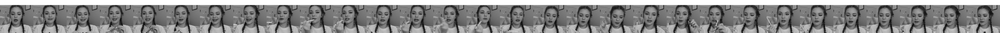

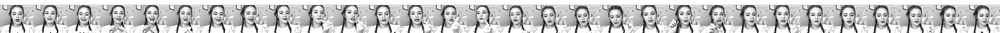

In [ ]:
import random

class Augmentation(nn.Module):
  def __init__(self, p_hflip=0.5):
    self.prob1 = p_hflip
  def __call__(self, imgs):
    # print(imgs.shape)
    rand_hflip = random.random()
    rand_sharp = random.random()
    rand_bright = random.random()
    s_factor = random.uniform(1,10)
    b_factor = random.uniform(0.8,1.8)
    # for i in range(len(imgs)):
      # img = torch.from_numpy(imgs[i])
      # img = imgs[i]
    if rand_hflip < self.prob1:
      imgs = tf.functional.hflip(imgs)
      # imgs[i] = img
    if rand_sharp < 0.6:
      if imgs.shape[-3] != 1:
        imgs = torch.unsqueeze(imgs,-3)
      # print(imgs.shape)
      imgs = tf.functional.adjust_sharpness(imgs, 10) 
      imgs = torch.squeeze(imgs)
    if rand_bright < 0.6:
      if imgs.shape[-3] != 1:
        imgs = torch.unsqueeze(imgs,-3)
      imgs = tf.functional.adjust_brightness(imgs, b_factor) 
      imgs = torch.squeeze(imgs)
    return imgs


'''Test 可確認augmentation後長怎樣'''
with open(root+'latest_data/30_256px/train/JJs_HTelie4.000.dat', "rb") as dat:
# with open(root+'latest_data/30_256px/train/-utrsarZeIY.001.dat', "rb") as dat:
  images = pickle.load(dat)

result = np.concatenate(images,axis=1)
show_64_image = cv2.resize(result*255.0, dsize=(3840, 128), interpolation=cv2.INTER_LINEAR)
cv2_imshow(show_64_image)

transform = Augmentation(1)
images = torch.from_numpy(images).float()
images = transform(images).numpy()
result = np.concatenate(images,axis=1)
show_64_image = cv2.resize(result*255.0, dsize=(3840, 128), interpolation=cv2.INTER_LINEAR)
cv2_imshow(show_64_image)

### Load data
Restarting kernel to free up memory

⛔

In [ ]:
# with open(root+'data_v2/train_set.dat', "rb") as training_file:
#     train_set_data = pickle.load(training_file)

In [ ]:
# with open(root+'data_v1/valid_set.dat', "rb") as validation_file:
#     validation_set_data = pickle.load(validation_file)

In [ ]:
# neuroticism = list()
# extraversion = list()
# agreeableness = list()
# conscientiousness = list()
# openness = list()
# for s in validation_set_data:
#   extraversion.append(s[1][0].item())
#   neuroticism.append(s[1][1].item())
#   agreeableness.append(s[1][2].item())
#   conscientiousness.append(s[1][3].item())
#   openness.append(s[1][4].item())

# df = pd.DataFrame({'neuroticism': neuroticism,'extraversion': extraversion,'agreeableness':agreeableness,'conscientiousness':conscientiousness,'openness':openness})
# df.plot(kind='density',xlim=(0,1))

In [ ]:
# # .dat -> dataset -> dataloader
# train_dataset = FrameAudioDataset(train_set_data, dim = 3)
# valid_dataset = FrameAudioDataset(validation_set_data, dim = 3)
# del train_set_data, validation_set_data
# print('Dataset length:\ntrain ',len(train_dataset),'\nvalid ',len(valid_dataset))

# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)

# print('Steps:\ntrain ',len(train_loader),'\nvalid ',len(valid_loader))

# # Dimension
# # Dataloader['image']: (Batch size, Channel=1, Depth=6,H,W)
# # Dataloader['label']: (Batch size, 5)

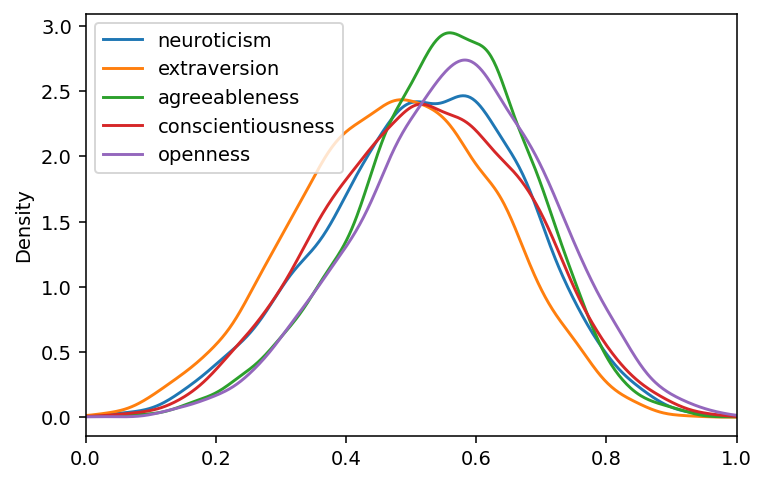

In [ ]:
gt = pickle.load( open( root+ "gt/annotation_training.pkl", "rb" ), encoding='latin1' )
neuroticism = list(gt['neuroticism'].values())
extraversion = list(gt['extraversion'].values())
agreeableness = list(gt['agreeableness'].values())
conscientiousness = list(gt['conscientiousness'].values())
openness = list(gt['openness'].values())

df = pd.DataFrame({'neuroticism': neuroticism,'extraversion': extraversion,'agreeableness':agreeableness,'conscientiousness':conscientiousness,'openness':openness})
# df.plot(kind='density',xlim=(0,1))
fig = plt.figure(dpi=140)
df.plot(kind='density',xlim=(0,1), ax = plt.gca())

In [ ]:
# gt = pickle.load( open( root+ "gt/annotation_test.pkl", "rb" ), encoding='latin1' )
# neuroticism = list(gt['neuroticism'].values())
# extraversion = list(gt['extraversion'].values())
# agreeableness = list(gt['agreeableness'].values())
# conscientiousness = list(gt['conscientiousness'].values())
# openness = list(gt['openness'].values())

# df = pd.DataFrame({'neuroticism': neuroticism,'extraversion': extraversion,'agreeableness':agreeableness,'conscientiousness':conscientiousness,'openness':openness})
# df.plot(kind='density',xlim=(0,1))

### New Load data
Load dat when needed

Set dim=1 if not using pretrained 3d resnet

In [ ]:
# big5 gt dictionary
features = ['extraversion', 'neuroticism', 'agreeableness', 'conscientiousness', 'openness']
gt_va = pickle.load( open(root+ "gt/annotation_validation.pkl", "rb" ), encoding='latin1' )
gt_tr = pickle.load( open(root+ "gt/annotation_training.pkl", "rb" ), encoding='latin1' )
gt_tt = pickle.load( open(root+ "gt/annotation_test.pkl", "rb" ), encoding='latin1' )
gt = dict(gt_va)
print(len(gt["extraversion"]))
print(len(gt_tr["extraversion"]))
print(len(gt_tt["extraversion"]))
for label in features:
  gt[label].update(gt_tr[label])
  gt[label].update(gt_tt[label])
print(len(gt["extraversion"]))

2000
6000
2000
10000


In [ ]:
# import torch.multiprocessing
# torch.multiprocessing.set_sharing_strategy('file_system')
from torch.utils.data.sampler import WeightedRandomSampler
transform = Augmentation(0.5)

# .dat -> dataset -> dataloader
train_dataset = FrameAudioDataset(path = root +'latest_data/30_256px/train', dim = 3, label_dict = gt, transform = transform)
valid_dataset = FrameAudioDataset(path = root +'latest_data/30_256px/valid', dim = 3, label_dict = gt)
weights = train_dataset.sample_weight()
weights_val = valid_dataset.sample_weight()
# train_dataset, _ = torch.utils.data.random_split(train_dataset, [1200, 4802], generator=torch.Generator().manual_seed(42))
valid_dataset, train_dataset2 = torch.utils.data.random_split(valid_dataset, [300, 1607], generator=torch.Generator().manual_seed(42))
# idx_list = train_dataset2.indices          
# weights2 = [weights_val[i] for i in idx_list] 

################# (train > 6000) (比原定trainset 還大的話) #############
# train_dataset = torch.utils.data.ConcatDataset([train_dataset, train_dataset2])
# weights = weights + weights2
###################################################################################

### if split: (train < 6000) (比原定trainset 還小的話) #############
# idx_list = train_dataset.indices              ###
# weights = [weights[i] for i in idx_list]        ###
###############################################################

sampler = WeightedRandomSampler(weights, int(len(weights) * 1.0))
print('Dataset length:\ntrain ',len(train_dataset),'\nvalid ',len(valid_dataset))

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler)
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True) #, drop_last=True
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

print('Steps:\ntrain ',len(train_loader),'\nvalid ',len(valid_loader))
del gt_va, gt_tt, gt_tr
# Dimension
# Dataloader['image']: (Batch size, Channel=1, Depth=6,H,W)
# Dataloader['label']: (Batch size, 5)

Dataset length:
train  6002 
valid  300
Steps:
train  751 
valid  38


50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200


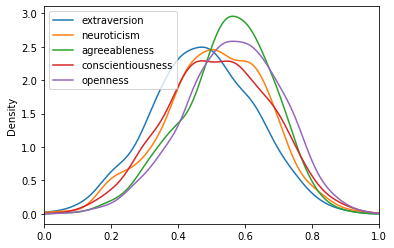

In [ ]:
# train 600
n = []
e = []
c =[]
a =[]
o =[]
x = 0

for data in train_dataset:
  x+=1
  if x % 50 == 0:
    print(x)
  score = data['label']
  e.append(score[0].item())
  n.append(score[1].item())
  a.append(score[2].item())
  c.append(score[3].item())
  o.append(score[4].item())

df = pd.DataFrame({'extraversion': e,'neuroticism': n,'agreeableness':a,'conscientiousness':c,'openness':o})
df.plot(kind='density',xlim=(0,1))

50
100
150
200
250
300


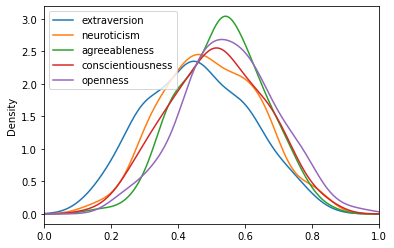

In [ ]:
# valid 300
n = []
e = []
c =[]
a =[]
o =[]
x = 0
for data in valid_dataset:
  x+=1
  if x % 50 == 0:
    print(x)
  score = data['label']
  e.append(score[0].item())
  n.append(score[1].item())
  a.append(score[2].item())
  c.append(score[3].item())
  o.append(score[4].item())

df = pd.DataFrame({'extraversion': e,'neuroticism': n,'agreeableness':a,'conscientiousness':c,'openness':o})
df.plot(kind='density',xlim=(0,1))

  0%|          | 0/75 [00:00<?, ?it/s]

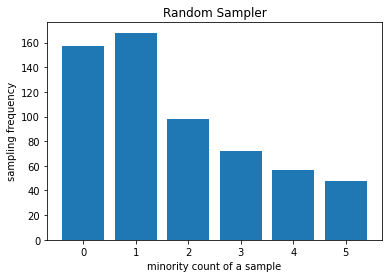

[157, 168, 98, 72, 57, 48]


In [ ]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
minor_count = list(range(6))
freq = [0]*6
for data in tqdm(train_loader):      
  labels = data['label']
  minor = torch.where((labels>=0.65)|(labels<=0.35), 1, 0)
  minor = torch.sum(minor, dim = 1)
  for m in minor:
    freq[m] += 1
plt.bar(minor_count, freq)
 
plt.xlabel("minority count of a sample")
plt.ylabel("sampling frequency")
plt.title("Random Sampler")
plt.show()
print(freq)

In [ ]:
print(weights)
sampler = WeightedRandomSampler(weights, int(len(weights) * 1.1))
train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler)
minor_count = list(range(6))
freq = [0]*6
for data in tqdm(train_loader):      
  labels = data['label']
  minor = torch.where((labels>=0.65)|(labels<=0.35), 1, 0)
  minor = torch.sum(minor, dim = 1)
  for m in minor:
    freq[m] += 1
plt.bar(minor_count, freq)
 
plt.xlabel("minority count of a sample")
plt.ylabel("sampling frequency")
plt.title("Weighted Sampler 4")
plt.show()
print(freq)

[7, 7, 10, 5, 10, 7, 10, 5, 5, 5, 6, 7, 7, 6, 6, 5, 9, 5, 10, 5, 7, 6, 8, 9, 9, 9, 6, 8, 5, 6, 5, 5, 5, 10, 5, 9, 6, 6, 6, 5, 10, 6, 7, 6, 6, 9, 5, 7, 7, 10, 6, 6, 5, 8, 5, 5, 6, 10, 6, 10, 5, 6, 7, 5, 5, 5, 5, 9, 6, 5, 6, 7, 8, 10, 6, 6, 6, 6, 5, 6, 8, 8, 6, 7, 5, 5, 7, 10, 10, 8, 6, 7, 8, 5, 6, 5, 9, 9, 5, 9, 6, 7, 6, 6, 8, 6, 8, 8, 7, 5, 6, 8, 7, 6, 5, 5, 7, 6, 10, 10, 5, 7, 5, 7, 9, 6, 5, 7, 7, 6, 5, 6, 7, 8, 7, 8, 8, 5, 5, 9, 5, 7, 6, 8, 5, 5, 7, 8, 6, 6, 10, 5, 5, 6, 9, 9, 6, 7, 5, 6, 6, 7, 10, 8, 7, 5, 7, 6, 6, 6, 6, 6, 7, 7, 6, 7, 6, 6, 5, 6, 5, 10, 5, 5, 8, 7, 5, 8, 8, 5, 6, 9, 9, 7, 5, 9, 10, 6, 5, 7, 6, 9, 8, 9, 7, 6, 7, 8, 5, 6, 7, 7, 6, 6, 6, 8, 6, 8, 6, 5, 10, 5, 8, 6, 6, 5, 8, 5, 5, 7, 6, 9, 6, 5, 7, 8, 6, 6, 5, 6, 6, 5, 6, 6, 6, 9, 6, 7, 7, 5, 8, 7, 8, 9, 7, 8, 6, 7, 5, 9, 6, 6, 6, 8, 6, 6, 5, 10, 7, 6, 8, 10, 10, 9, 6, 7, 6, 7, 8, 6, 7, 7, 5, 8, 7, 5, 6, 5, 6, 10, 5, 8, 8, 6, 5, 6, 9, 5, 5, 8, 10, 5, 6, 9, 8, 8, 7, 8, 9, 5, 5, 5, 5, 9, 10, 9, 10, 6, 5, 10, 6, 9, 6, 5, 

  0%|          | 0/83 [00:00<?, ?it/s]

### Model *



#### Helper
load checkpoint

In [ ]:
def load_checkpoint(model=None, optimizer=None, filepath=None):

  if not os.path.isfile(filepath):
    print('No checkpoint exists')
    return 0
  print("Loading checkpoint '{}'".format(filepath))
  if torch.cuda.is_available():
    # Load all tensors onto previous state
    model.cuda() # move to cuda before load state, or else error will occur at optimizer.step
    checkpoint = torch.load(filepath)
  else:
    # Load all tensors onto the CPU
    checkpoint = torch.load(filepath, map_location=lambda storage, loc: storage)
  epoch = checkpoint['epoch']
  if optimizer:
    try:
      optimizer.load_state_dict(checkpoint['optimizer'])
    except ValueError as err:
      print('[WARNING]', err)
      print('[WARNING] optimizer not restored from last checkpoint, continue without previous state')

  if model:
    model.load_state_dict(checkpoint['model'])  # _extract_state_from_dataparallel
    return epoch


#### Backbone

https://github.com/kenshohara/3D-ResNets-PyTorch

In [ ]:
import math
from functools import partial
import torch.nn.functional as F

def get_inplanes():
    return [64, 128, 256, 512]


def conv3x3x3(in_planes, out_planes, stride=1):
    return nn.Conv3d(in_planes, out_planes, kernel_size=3, stride=stride, padding=1, bias=False)

def conv1x1x1(in_planes, out_planes, stride=1):
    return nn.Conv3d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)

class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1, downsample=None, dropout_rate = 0):
        super().__init__()

        self.conv1 = conv3x3x3(in_planes, planes, stride)
        self.bn1 = nn.BatchNorm3d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.dropout1 = nn.Dropout(dropout_rate)
        self.conv2 = conv3x3x3(planes, planes)
        self.bn2 = nn.BatchNorm3d(planes)
        self.dropout2 = nn.Dropout(dropout_rate)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.dropout1(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.dropout2(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out

class Bottleneck(nn.Module):  # block for deeper layers
    expansion = 4

    def __init__(self, in_planes, planes, stride=1, downsample=None):
        super().__init__()

        self.conv1 = conv1x1x1(in_planes, planes)
        self.bn1 = nn.BatchNorm3d(planes)
        self.conv2 = conv3x3x3(planes, planes, stride)
        self.bn2 = nn.BatchNorm3d(planes)
        self.conv3 = conv1x1x1(planes, planes * self.expansion)
        self.bn3 = nn.BatchNorm3d(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out

class ResNet(nn.Module):

    def __init__(self, block, layers, block_inplanes, n_input_channels=1, conv1_t_size=7, conv1_t_stride=1, no_max_pool=False,
            shortcut_type='B', widen_factor=1.0, n_class=10, dropout_rate = 0):
        super().__init__()

        block_inplanes = [int(x * widen_factor) for x in block_inplanes]

        self.in_planes = block_inplanes[0]
        self.no_max_pool = no_max_pool

        self.conv1 = nn.Conv3d(n_input_channels,
                    self.in_planes,
                    kernel_size=(conv1_t_size, 7, 7),
                    stride=(conv1_t_stride, 2, 2),
                    padding=(conv1_t_size // 2, 3, 3),
                    bias=False)
        self.bn1 = nn.BatchNorm3d(self.in_planes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool3d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, block_inplanes[0], layers[0], shortcut_type)
        self.layer2 = self._make_layer(block,
                        block_inplanes[1],
                        layers[1],
                        shortcut_type,
                        stride=2)
        self.layer3 = self._make_layer(block,
                        block_inplanes[2],
                        layers[2],
                        shortcut_type,
                        stride=2)
        self.layer4 = self._make_layer(block,
                        block_inplanes[3],
                        layers[3],
                        shortcut_type,
                        stride=2, dropout_rate = dropout_rate)
        # self.dropout = nn.Dropout(p=dropout_rate)
        self.sigmoid = nn.Sigmoid()
        self.avgpool = nn.AdaptiveAvgPool3d((1, 1, 1))
        self.fc = nn.Linear(block_inplanes[3] * block.expansion,  n_class)

        for m in self.modules():
            if isinstance(m, nn.Conv3d):
                nn.init.kaiming_normal_(m.weight,
                            mode='fan_out',
                            nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm3d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def _downsample_basic_block(self, x, planes, stride):
        out = F.avg_pool3d(x, kernel_size=1, stride=stride)
        zero_pads = torch.zeros(out.size(0), planes - out.size(1), out.size(2),
                                out.size(3), out.size(4))
        if isinstance(out.data, torch.cuda.FloatTensor):
            zero_pads = zero_pads.cuda()

        out = torch.cat([out.data, zero_pads], dim=1)

        return out

    def _make_layer(self, block, planes, blocks, shortcut_type, stride=1, dropout_rate = 0):
        downsample = None
        if stride != 1 or self.in_planes != planes * block.expansion:
            if shortcut_type == 'A':
                downsample = partial(self._downsample_basic_block,
                            planes=planes * block.expansion,
                            stride=stride)
            else:
                downsample = nn.Sequential(
                    conv1x1x1(self.in_planes, planes * block.expansion, stride),
                    nn.BatchNorm3d(planes * block.expansion))

        layers = []
        layers.append(
            block(in_planes=self.in_planes,
                planes=planes,
                stride=stride,
                downsample=downsample))
        self.in_planes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.in_planes, planes, dropout_rate = dropout_rate))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        if not self.no_max_pool:
            x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        # x = self.dropout(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        x = self.sigmoid(x)
        return x


def generate_resnet_model(model_depth, **kwargs):
    assert model_depth in [10, 18, 34, 50, 101, 152, 200]

    if model_depth == 10:
        model = ResNet(BasicBlock, [1, 1, 1, 1], get_inplanes(), **kwargs)
    elif model_depth == 18:
        model = ResNet(BasicBlock, [2, 2, 2, 2], get_inplanes(), **kwargs)
    elif model_depth == 34:
        model = ResNet(BasicBlock, [3, 4, 6, 3], get_inplanes(), **kwargs)
    elif model_depth == 50:
        model = ResNet(Bottleneck, [3, 4, 6, 3], get_inplanes(), **kwargs)
    elif model_depth == 101:
        model = ResNet(Bottleneck, [3, 4, 23, 3], get_inplanes(), **kwargs)
    elif model_depth == 152:
        model = ResNet(Bottleneck, [3, 8, 36, 3], get_inplanes(), **kwargs)
    elif model_depth == 200:
        model = ResNet(Bottleneck, [3, 24, 36, 3], get_inplanes(), **kwargs)

    return model

In [ ]:
def get_module_name(name):
    name = name.split('.')
    if name[0] == 'module':
        i = 1
    else:
        i = 0
    if name[i] == 'features':
        i += 1
    return name[i]

def get_fine_tuning_parameters(model, ft_begin_module):
    if not ft_begin_module:
        return model.parameters()

    parameters = []
    add_flag = False
    for k, v in model.named_parameters():
        if ft_begin_module == get_module_name(k):
            add_flag = True
        if add_flag:
            parameters.append({'params': v})
    return parameters



def load_pretrained_model(model, pretrain_path, model_name, n_finetune_classes, freeze = False):
    if pretrain_path:
        print('loading pretrained model {}'.format(pretrain_path))
        pretrain = torch.load(pretrain_path, map_location='cpu')

        model.load_state_dict(pretrain['state_dict'])
        # freeze weight
        if freeze:
          for param in model.parameters():
            param.requires_grad = False
          for param in model.layer4[1].parameters():
            param.requires_grad = True
          # but not freeze batch norm
          for i in [0,1]:
            model.layer1[i].bn1 = nn.BatchNorm3d(64)
            model.layer1[i].bn2 = nn.BatchNorm3d(64)
            model.layer2[i].bn1 = nn.BatchNorm3d(128)
            model.layer2[i].bn2 = nn.BatchNorm3d(128)
            model.layer3[i].bn1 = nn.BatchNorm3d(256)
            model.layer3[i].bn2 = nn.BatchNorm3d(256)
            model.layer4[i].bn1 = nn.BatchNorm3d(512)
            model.layer4[i].bn2 = nn.BatchNorm3d(512)
          model.layer2[0].downsample[1] = nn.BatchNorm3d(128)
          model.layer3[0].downsample[1] = nn.BatchNorm3d(256)
          model.layer4[0].downsample[1] = nn.BatchNorm3d(512)
          model.layer4[1].conv1 = nn.Conv3d(512, 512, kernel_size=(3, 3, 3),stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          model.layer4[1].conv2 = nn.Conv3d(512, 512, kernel_size=(3, 3, 3),stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          model.bn1 = nn.BatchNorm3d(64)
        tmp_model = model
        if model_name == 'densenet':
            tmp_model.classifier = nn.Linear(tmp_model.classifier.in_features, n_finetune_classes)
        else:
            tmp_model.fc = nn.Linear(tmp_model.fc.in_features, n_finetune_classes)

    return model


#### CNN Block, resnet+CNN
Reference:

CNN, resCNN:
[Bi-modal First Impressions Recognition using Temporally Ordered Deep Audio and Stochastic Visual Features ](https://github.com/InnovArul/first-impressions)

CNN5: [won fisrt place in Chalearn](https://tzzcl.github.io/papers/eccvw16_APA.pdf)([kernel size used ](http://www.bmva.org/bmvc/2015/papers/paper041/paper041.pdf)). 100 frame, 224, did not crop face, bimodal. [Prove on what is learned in CNN layers.](https://openaccess.thecvf.com/content_cvpr_2017_workshops/w26/papers/Ventura_Interpreting_CNN_Models_CVPR_2017_paper.pdf)

In [ ]:
#resCNN
class Res_CNN(nn.Module):

    def __init__(self, in_planes, num_classes, downsample=None, droprate = 0, freeze = True):
        super(Res_CNN, self).__init__()

        resnet = generate_resnet_model(model_depth=18,
                  n_class=700,
                  n_input_channels=in_planes,
                  shortcut_type='B',
                  conv1_t_size=7,
                  conv1_t_stride=1,
                  no_max_pool=True,
                  widen_factor=1, dropout_rate = 0)
        pretrain_path = root+ 'pretrained_model/r3d18_K_200ep.pth'
        self.resnet = load_pretrained_model(resnet, pretrain_path, model_name = None, n_finetune_classes = num_classes)
        
        # freeze weight
        if freeze:
          for param in self.resnet.parameters():
            param.requires_grad = False
          # for param in self.resnet.layer4.parameters():
          #   param.requires_grad = True
          # but not freeze batch norm weight
          for i in [0,1]:
            self.resnet.layer1[i].bn1 = nn.BatchNorm3d(64)
            self.resnet.layer1[i].bn2 = nn.BatchNorm3d(64)
            self.resnet.layer2[i].bn1 = nn.BatchNorm3d(128)
            self.resnet.layer2[i].bn2 = nn.BatchNorm3d(128)
            self.resnet.layer3[i].bn1 = nn.BatchNorm3d(256)
            self.resnet.layer3[i].bn2 = nn.BatchNorm3d(256)
            self.resnet.layer4[i].bn1 = nn.BatchNorm3d(512)
            self.resnet.layer4[i].bn2 = nn.BatchNorm3d(512)
          self.resnet.layer2[0].downsample[1] = nn.BatchNorm3d(128)
          self.resnet.layer3[0].downsample[1] = nn.BatchNorm3d(256)
          self.resnet.layer4[0].downsample[1] = nn.BatchNorm3d(512)
          self.resnet.bn1 = nn.BatchNorm3d(64)
          # self.resnet.layer4[1].conv1 = nn.Conv3d(512, 512, kernel_size=(3, 3, 3),stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          # self.resnet.layer4[1].conv2 = nn.Conv3d(512, 512, kernel_size=(3, 3, 3),stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          

        '''128'''
        self.conv1 = nn.ConvTranspose3d(512, 128, kernel_size=(1,2,2), stride = (1,1,1), padding=0)
        self.relu1 = nn.ReLU()
        # self.maxpool1 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1)
        self.conv2 = nn.ConvTranspose3d(128,32, kernel_size=(1,5,5), stride = (1,1,1), padding=0)  
        self.relu2 = nn.ReLU()
        
        self.conv3 = nn.ConvTranspose3d(32,32, kernel_size=(1,5,5), stride = (1,1,1), padding=0)  
        # self.maxpool3 = nn.MaxPool3d(kernel_size=(1,2,2), stride=1, padding=0)
        self.avgpool3 = nn.AvgPool3d(kernel_size=(1,2,2), stride=1, padding=0)
        self.dropout = nn.Dropout(droprate)
        
        self.fc1 = nn.Linear(18496 , 6000) #18496 16384
        self.fc2 = nn.Linear(6000 , 1200)
        self.fc3 = nn.Linear(1200 , 200)
        self.fc4 = nn.Linear(200 , num_classes)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        x = self.resnet.conv1(x)
        x = self.resnet.bn1(x)
        x = self.resnet.relu(x)
        x = self.resnet.maxpool(x)  # for 128
        x = self.resnet.layer1(x)
        x = self.resnet.layer2(x)
        x = self.resnet.layer3(x)
        x = self.resnet.layer4(x) # for 128
        print('x' ,x.shape)
        out = self.conv1(x)
        # print('conv1' ,out.shape)
        out = self.relu1(out)
        # out = self.avgpool1(out) # for 256
        # print('maxpool' ,out.shape)
        out = self.dropout(out)
        out = self.conv2(out)
        # print('conv2' ,out.shape)
        out = self.relu2(out)
        
        # print('maxpool2' ,out.shape)
        out = self.conv3(out)
        # out = self.maxpool3(out)
        # out = self.avgpool3(out)
        # print('conv3' ,out.shape)
        out = self.dropout(out)
        # out = self.conv4(out)
        out = out.view(out.size(0), -1)
        out = self.fc1(out)
        # print('fc1 ' ,out.shape)
        out = self.fc2(out)
        out = self.fc3(out)
        out = self.fc4(out)  # for 128
        # print('fc2 ' ,out.shape)
        # out = self.sigmoid(out)
        return x#out

In [ ]:
# resCNN3
class Res_CNN(nn.Module):

    def __init__(self, in_planes, num_classes, downsample=None, droprate = 0, freeze = True):
        super(Res_CNN, self).__init__()

        resnet = generate_resnet_model(model_depth=18,
                  n_class=700,
                  n_input_channels=in_planes,
                  shortcut_type='B',
                  conv1_t_size=7,
                  conv1_t_stride=1,
                  no_max_pool=True,
                  widen_factor=1, dropout_rate = 0)
        pretrain_path = root+ 'pretrained_model/r3d18_K_200ep.pth'
        self.resnet = load_pretrained_model(resnet, pretrain_path, model_name = None, n_finetune_classes = num_classes)
        
        # freeze weight
        if freeze:
          for param in self.resnet.parameters():
            param.requires_grad = False
          # for param in self.resnet.layer4.parameters():
          #   param.requires_grad = True
          # but not freeze batch norm weight
          for i in [0,1]:
            self.resnet.layer1[i].bn1 = nn.BatchNorm3d(64)
            self.resnet.layer1[i].bn2 = nn.BatchNorm3d(64)
            self.resnet.layer2[i].bn1 = nn.BatchNorm3d(128)
            self.resnet.layer2[i].bn2 = nn.BatchNorm3d(128)
            self.resnet.layer3[i].bn1 = nn.BatchNorm3d(256)
            self.resnet.layer3[i].bn2 = nn.BatchNorm3d(256)
            self.resnet.layer4[i].bn1 = nn.BatchNorm3d(512)
            self.resnet.layer4[i].bn2 = nn.BatchNorm3d(512)
          self.resnet.layer2[0].downsample[1] = nn.BatchNorm3d(128)
          self.resnet.layer3[0].downsample[1] = nn.BatchNorm3d(256)
          # self.resnet.layer4[0].downsample[1] = nn.BatchNorm3d(512)
          self.resnet.bn1 = nn.BatchNorm3d(64)
          # self.resnet.layer4[1].conv1 = nn.Conv3d(512, 512, kernel_size=(3, 3, 3),stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          # self.resnet.layer4[1].conv2 = nn.Conv3d(512, 512, kernel_size=(3, 3, 3),stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          self.resnet.layer4 = None
          



        '''256'''
        self.conv1 = nn.Conv3d(256, 64, kernel_size=(1,5,5), stride = (1,1,1), padding=(0,1,1))
        # self.conv1 = nn.ConvTranspose3d(512, 128, kernel_size=(2,2,2), stride = (1,1,1), padding=0)
        self.relu1 = nn.ReLU()
        self.avgpool1 = nn.AvgPool3d(kernel_size=(1,3,3), stride=1, padding=0)
        self.conv2 = nn.Conv3d(64,16, kernel_size=(1,5,5), stride = 1, padding=(0,1,1))  
        self.relu2 = nn.ReLU()
        # self.conv3 = nn.Conv3d(16,8, kernel_size=(1,3,3), stride = (1,1,1), padding=0)  
        # self.avgpool3 = nn.AvgPool3d(kernel_size=(2,3,3), stride=1, padding=0)
        self.dropout = nn.Dropout(droprate)
        # self.conv4 = nn.Conv3d(8,8, kernel_size=(1,5,5), stride = (1,1,1), padding=0)  
        self.fc1 = nn.Linear( 16* 4* 10* 10 , 4000)
        self.fc2 = nn.Linear(4000 ,400)
        self.fc3 = nn.Linear(400 , num_classes)
        self.sigmoid = nn.Sigmoid()
        # self.res_avgpool = nn.AvgPool3d(kernel_size=3, stride=2, padding=1)

    def forward(self, x):
        x = self.resnet.conv1(x)
        x = self.resnet.bn1(x)
        x = self.resnet.relu(x)
        # x = self.res_avgpool(x)  # for 128
        x = self.resnet.maxpool(x)  # for 128
        x = self.resnet.layer1(x)
        x = self.resnet.layer2(x)
        x = self.resnet.layer3(x)
        # x = self.resnet.layer4(x) # for 128
        # print('x' ,x.shape)
        out = self.conv1(x)
        # print('conv1' ,out.shape)
        out = self.relu1(out)
        out = self.avgpool1(out) # for 256
        # print('maxpool' ,out.shape)
        out = self.dropout(out)
        out = self.conv2(out)
        # print('conv2' ,out.shape)
        out = self.relu2(out)
        
        # print('maxpool2' ,out.shape)
        # # out = self.conv3(out)
        # # out = self.maxpool3(out)
        # out = self.avgpool3(out)
        # # print('conv3' ,out.shape)
        out = self.dropout(out)
        # # out = self.conv4(out)
        out = out.view(out.size(0), -1)
        out = self.fc1(out)
        # print('fc1 ' ,out.shape)
        out = self.fc2(out)
        out = self.fc3(out)
        # out = self.fc4(out)  # for 128
        # print('fc2 ' ,out.shape)
        out = self.sigmoid(out)
        return out

In [ ]:
# 4
class Res_CNN(nn.Module):

    def __init__(self, in_planes, num_classes, downsample=None, droprate = 0, freeze = True):
        super(Res_CNN, self).__init__()

        resnet = generate_resnet_model(model_depth=18,
                  n_class=700,
                  n_input_channels=in_planes,
                  shortcut_type='B',
                  conv1_t_size=7,
                  conv1_t_stride=1,
                  no_max_pool=True,
                  widen_factor=1, dropout_rate = 0)
        pretrain_path = root+ 'pretrained_model/r3d18_K_200ep.pth'
        self.resnet = load_pretrained_model(resnet, pretrain_path, model_name = None, n_finetune_classes = num_classes)
        
        # freeze weight
        if freeze:
          for param in self.resnet.parameters():
            param.requires_grad = False
          # for param in self.resnet.layer4.parameters():
          #   param.requires_grad = True
          # but not freeze batch norm weight
          for i in [0,1]:
            self.resnet.layer1[i].bn1 = nn.BatchNorm3d(64)
            self.resnet.layer1[i].bn2 = nn.BatchNorm3d(64)
            self.resnet.layer2[i].bn1 = nn.BatchNorm3d(128)
            self.resnet.layer2[i].bn2 = nn.BatchNorm3d(128)
            self.resnet.layer3[i].bn1 = nn.BatchNorm3d(256)
            self.resnet.layer3[i].bn2 = nn.BatchNorm3d(256)
            # self.resnet.layer4[i].bn1 = nn.BatchNorm3d(512)
            # self.resnet.layer4[i].bn2 = nn.BatchNorm3d(512)
          self.resnet.layer2[0].downsample[1] = nn.BatchNorm3d(128)
          self.resnet.layer3[0].downsample[1] = nn.BatchNorm3d(256)
          # self.resnet.layer4[0].downsample[1] = nn.BatchNorm3d(512)
          self.resnet.bn1 = nn.BatchNorm3d(64)
          # self.resnet.layer4[1].conv1 = nn.Conv3d(512, 512, kernel_size=(3, 3, 3),stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          # self.resnet.layer4[1].conv2 = nn.Conv3d(512, 512, kernel_size=(3, 3, 3),stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          self.resnet.layer4 = None
          # self.resnet.layer3 = None
          



        '''256'''
        self.conv1 = nn.Conv3d(256,64 , kernel_size=(1,5,5), stride = (1,1,1), padding=(0,1,1))
        self.relu1 = nn.ReLU()
        self.avgpool1 = nn.AvgPool3d(kernel_size=(1,3,3), stride=1, padding=0)
        self.conv2 = nn.Conv3d(64,16, kernel_size=(1,5,5), stride = 1, padding=(0,1,1))  
        self.relu2 = nn.ReLU()
        # self.conv3 = nn.Conv3d(16,8, kernel_size=(1,3,3), stride = (1,1,1), padding=0)  
        # self.avgpool3 = nn.AvgPool3d(kernel_size=(2,3,3), stride=1, padding=0)
        self.dropout = nn.Dropout(droprate)
        # self.conv4 = nn.Conv3d(8,8, kernel_size=(1,5,5), stride = (1,1,1), padding=0)  
        self.fc1 = nn.Linear( 64* 10* 10 , 2000)
        # self.fc2 = nn.Linear(6400 ,400)
        self.fc3 = nn.Linear(2000 , num_classes)
        self.sigmoid = nn.Sigmoid()
        # self.res_avgpool = nn.AvgPool3d(kernel_size=3, stride=2, padding=1)

    def forward(self, x):
        x = self.resnet.conv1(x)
        x = self.resnet.bn1(x)
        x = self.resnet.relu(x)
        # x = self.res_avgpool(x)  # for 128
        x = self.resnet.maxpool(x)  # for 128
        x = self.resnet.layer1(x)
        x = self.resnet.layer2(x)
        x = self.resnet.layer3(x)
        # x = self.resnet.layer4(x) # for 128
        # print('x' ,x.shape)
        out = self.conv1(x)
        # print('conv1' ,out.shape)
        out = self.relu1(out)
        out = self.avgpool1(out) # for 256
        # print('maxpool' ,out.shape)
        out = self.dropout(out)
        out = self.conv2(out)
        # print('conv2' ,out.shape)
        out = self.relu2(out)
        out = self.dropout(out)
        
        # print('maxpool2' ,out.shape)
        # # out = self.conv3(out)
        # # out = self.maxpool3(out)
        # out = self.avgpool3(out)
        # # print('conv3' ,out.shape)
        # # out = self.conv4(out)
        out = out.view(out.size(0), -1)
        out = self.fc1(out)
        # print('fc1 ' ,out.shape)
        # out = self.fc2(out)
        out = self.fc3(out)
        # out = self.fc4(out)  # for 128
        # print('fc2 ' ,out.shape)
        out = self.sigmoid(out)
        return out

#### 2D CNN+LSTM
reference: https://arxiv.org/pdf/1610.10048.pdf

In [ ]:
class CNN_LSTM(nn.Module):

    def __init__(self, in_planes, num_classes, downsample=None, droprate = 0):
        super(CNN_LSTM, self).__init__()


        self.sigmoid = nn.Sigmoid()

        self.conv1 = nn.Conv3d(1, 32, kernel_size=(1, 5, 5), stride=(1, 1, 1), padding=(0,1,1))
        # self.bn1  = nn.BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu1 = nn.ReLU(inplace=True)
        self.maxpool1 = nn.MaxPool3d(kernel_size=(1,3,3), stride=(1,2,2), padding=0, dilation=1)
        
        self.conv2 = nn.Conv3d(32, 32, kernel_size=(1, 7, 7), stride=(1, 1, 1), padding=(0,1,1))
        # self.bn2  = nn.BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu2 = nn.ReLU(inplace=True)
        # self.dropout1 = nn.Dropout(p=0, inplace=False)
        self.maxpool2 = nn.MaxPool3d(kernel_size=(1,3,3), stride=(1,2,2), padding=0, dilation=1)
        self.dropout1 = nn.Dropout(p=droprate, inplace=False)
        self.conv3 = nn.Conv3d(32, 16, kernel_size=(1, 7, 7), stride=(1, 1, 1), padding=0)
        # self.bn3  = nn.BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu3 = nn.ReLU(inplace=True)
        self.maxpool3 = nn.MaxPool3d(kernel_size=(1,2,2), stride=(1,2,2), padding=0, dilation=1)

        self.lstm = nn.LSTM(input_size=11664, hidden_size = 64, num_layers = 8, batch_first=True, dropout = 0.1) #11664
        self.fc1 = nn.Linear(1920 , 512)  #21632
        # self.dropout2 = nn.Dropout(p=droprate, inplace=False)
        self.fc2 = nn.Linear(512 , 100)
        self.fc3 = nn.Linear(100 , num_classes)

    def forward(self, x):
        # print('x' ,x.shape)
        out = self.conv1(x)
        # print('conv1' ,out.shape)
        out = self.relu1(out)
        out = self.maxpool1(out)
        # print('maxpool1' ,out.shape)
        out = self.conv2(out)
        # print('conv2' ,out.shape)
        out = self.relu2(out)
        out = self.maxpool2(out)
        out = self.dropout1(out)
        # print('maxpool2' ,out.shape)
        out = self.conv3(out)
        out = self.relu3(out)
        out = self.maxpool3(out)

        out = out.view(out.size(0),out.size(2), -1)
        out, (_,_) = self.lstm(out)

        
        out = out.contiguous().view(out.size(0), -1)
        # out = torch.reshape(out, (0,-1,))
        # print('lstm' ,out.shape)
        out = self.fc1(out)
        # # print('fc1 ' ,out.shape)
        # # out = self.dropout2(out)
        out = self.fc2(out)
        out = self.fc3(out)
        # # print('fc2 ' ,out.shape)
        # out = self.sigmoid(out)
        return out

### Build model

In [ ]:
model = CNN_LSTM(1, n_class)
print(model)
summary(model, input_size=(batch_size, 1, 30, 256, 256))

In [ ]:
model = generate_resnet_model(model_depth=34,
                n_class=n_class,
                n_input_channels=3,
                shortcut_type='B',
                conv1_t_size=7,
                conv1_t_stride=1,
                no_max_pool=True,
                widen_factor=1, dropout_rate = 0)

print(model)
summary(model, input_size=(batch_size, 3, 30, 256, 256)) 

ResNet(
  (conv1): Conv3d(3, 64, kernel_size=(7, 7, 7), stride=(1, 2, 2), padding=(3, 3, 3), bias=False)
  (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
      (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0, inplace=False)
      (conv2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
      (bn2): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0, inplace=False)
    )
    (1): BasicBlock(
      (conv1): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [8, 5]                    --
├─Conv3d: 1-1                            [8, 64, 30, 128, 128]     65,856
├─BatchNorm3d: 1-2                       [8, 64, 30, 128, 128]     128
├─ReLU: 1-3                              [8, 64, 30, 128, 128]     --
├─Sequential: 1-4                        [8, 64, 30, 128, 128]     --
│    └─BasicBlock: 2-1                   [8, 64, 30, 128, 128]     --
│    │    └─Conv3d: 3-1                  [8, 64, 30, 128, 128]     110,592
│    │    └─BatchNorm3d: 3-2             [8, 64, 30, 128, 128]     128
│    │    └─ReLU: 3-3                    [8, 64, 30, 128, 128]     --
│    │    └─Dropout: 3-4                 [8, 64, 30, 128, 128]     --
│    │    └─Conv3d: 3-5                  [8, 64, 30, 128, 128]     110,592
│    │    └─BatchNorm3d: 3-6             [8, 64, 30, 128, 128]     128
│    │    └─Dropout: 3-7                 [8, 64, 30, 128, 128]     -

#### Combine Resnet & CNN Block 

In [ ]:
# resCNN3
model = Res_CNN(3, n_class, droprate = 0.4)
print(model)
summary(model, input_size=(batch_size, 3, 30, 256, 256)) 

loading pretrained model /content/drive/MyDrive/IM_project/dlib_testing/Big5/pretrained_model/r3d18_K_200ep.pth
Res_CNN(
  (resnet): ResNet(
    (conv1): Conv3d(3, 64, kernel_size=(7, 7, 7), stride=(1, 2, 2), padding=(3, 3, 3), bias=False)
    (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (dropout1): Dropout(p=0, inplace=False)
        (conv2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        (bn2): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (dropout2)

Layer (type:depth-idx)                        Output Shape              Param #
Res_CNN                                       [8, 5]                    --
├─ResNet: 1-1                                 --                        2,565
│    └─Conv3d: 2-1                            [8, 64, 30, 128, 128]     (65,856)
│    └─BatchNorm3d: 2-2                       [8, 64, 30, 128, 128]     128
│    └─ReLU: 2-3                              [8, 64, 30, 128, 128]     --
│    └─MaxPool3d: 2-4                         [8, 64, 15, 64, 64]       --
│    └─Sequential: 2-5                        [8, 64, 15, 64, 64]       --
│    │    └─BasicBlock: 3-1                   [8, 64, 15, 64, 64]       221,440
│    │    └─BasicBlock: 3-2                   [8, 64, 15, 64, 64]       221,440
│    └─Sequential: 2-6                        [8, 128, 8, 32, 32]       --
│    │    └─BasicBlock: 3-3                   [8, 128, 8, 32, 32]       672,512
│    │    └─BasicBlock: 3-4                   [8, 128, 8, 32, 32]     

In [ ]:
# 4
model = Res_CNN(3, n_class, droprate = 0.4)
print(model)
summary(model, input_size=(batch_size, 3, 30, 256, 256)) 

loading pretrained model /content/drive/MyDrive/IM_project/dlib_testing/Big5/pretrained_model/r3d18_K_200ep.pth
Res_CNN(
  (resnet): ResNet(
    (conv1): Conv3d(3, 64, kernel_size=(7, 7, 7), stride=(1, 2, 2), padding=(3, 3, 3), bias=False)
    (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (dropout1): Dropout(p=0, inplace=False)
        (conv2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        (bn2): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (dropout2)

Layer (type:depth-idx)                        Output Shape              Param #
Res_CNN                                       [8, 5]                    --
├─ResNet: 1-1                                 --                        2,565
│    └─Conv3d: 2-1                            [8, 64, 30, 128, 128]     (65,856)
│    └─BatchNorm3d: 2-2                       [8, 64, 30, 128, 128]     128
│    └─ReLU: 2-3                              [8, 64, 30, 128, 128]     --
│    └─MaxPool3d: 2-4                         [8, 64, 15, 64, 64]       --
│    └─Sequential: 2-5                        [8, 64, 15, 64, 64]       --
│    │    └─BasicBlock: 3-1                   [8, 64, 15, 64, 64]       221,440
│    │    └─BasicBlock: 3-2                   [8, 64, 15, 64, 64]       221,440
│    └─Sequential: 2-6                        [8, 128, 8, 32, 32]       --
│    │    └─BasicBlock: 3-3                   [8, 128, 8, 32, 32]       672,512
│    │    └─BasicBlock: 3-4                   [8, 128, 8, 32, 32]     

In [ ]:
model = Res_CNN(3, n_class, droprate = 0.4)
# print(model)
summary(model, input_size=(batch_size, 3, 30, 256, 256)) 

### Optimizer & Checkpoint ✅
別改順序

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

if resume:
  start_epoch = load_checkpoint(model, optimizer, filepath=resume_path)
else:
  start_epoch = 0
print('start from epoch', start_epoch)

Loading checkpoint '/content/drive/MyDrive/IM_project/dlib_testing/Big5/checkpoint/1203_6000_resCNN3_scheduler/newest.pkl'
start from epoch 10


### Train Helper *
train, valid, loss function

In [ ]:
MAEloss = nn.L1Loss(reduction = 'none')
# loss_func = nn.MSELoss()
loss_func = nn.L1Loss(reduction = 'mean')
loss_func_tr = nn.L1Loss(reduction = 'none')
acc_thres = 0.1
acc_thres_15 = 0.15
acc_thres_20 = 0.2

In [ ]:
def train(loader, model, optimizer, epoch, scheduler):

  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  train_loss = []
  total_mae_loss = 0
  sample = 0
  correct = [0]*5
  class_mae = [0]*5
  minor_correct = [0]*5 
  minor_class_mae = [0]*5
  minor_count = [0]*5

  # Sets the module in training mode.
  model.train()
  n_step = len(loader)
  step_count = 0
  for data in tqdm(loader):
    step_count += 1 
    inputs = data['images'].to(device)       
    labels = data['label'].to(device)
    # print(inputs.shape)
    # temp = inputs[0][0][:5].cpu().numpy()
    # result = np.concatenate(temp,axis=1)
    # show_64_image = cv2.resize(result*255.0, dsize=(768, 128), interpolation=cv2.INTER_LINEAR)
    # cv2_imshow(show_64_image)

    optimizer.zero_grad()
    outputs = model(inputs)
    
    '''monitor criterion'''    
    # competition accuracy (1-MAE)
    mae_loss = MAEloss(outputs, labels)
    total_mae_loss += torch.sum(mae_loss).item()
    sample += inputs.shape[0]

    # each class MAE
    batch_class_mae = torch.sum(mae_loss, dim =0)
    class_mae = [m+n for m,n in zip(class_mae, batch_class_mae)]

    # self define accuracy: if |true-pred| < thres, then view as correct prediction
    binary = torch.where(mae_loss <= acc_thres, 1, 0)
    correct = [m+n.item() for m,n in zip(correct, torch.sum(binary, dim=0))]


    # minor samples MAE & accuracy
    minor_ae = torch.where((labels>0.65)|(labels<0.35), mae_loss, 0)
    minor_batch_class_mae = torch.sum(minor_ae, dim = 0)
    minor_class_mae = [m+n.item() for m,n in zip(minor_class_mae, minor_batch_class_mae)]
    minor_binary = torch.where((minor_ae <= acc_thres)&((labels>0.65)|(labels<0.35)), 1, 0)
    minor_correct = [m+n.item() for m,n in zip(minor_correct, torch.sum(minor_binary, dim=0))]
    
    minor = torch.where((labels>0.65)|(labels<0.35), 1, 0)
    minor_count = [m+n.item() for m,n in zip(minor_count, torch.sum(minor, dim=0))]
    # if step_count <5:
    #   print(minor_ae,'\n', minor_count )
      # print(minor_correct)

    '''loss backward'''
    loss = loss_func_tr(outputs, labels)
    # loss = torch.sum(torch.where((labels>0.65)|(labels<0.35), loss, loss*2))#2,5
    loss = torch.sum(loss)
    loss.backward()
    optimizer.step()

    train_loss.append(loss.item())

  train_loss = sum(train_loss) / len(train_loss)
  comp_train_acc = 1- total_mae_loss / sample/ n_class
  self_acc = [m/sample for m in correct]
  class_mae = [m/sample for m in class_mae]
  minor_class_acc = [m/n for m,n in zip(minor_correct, minor_count)]
  minor_class_mae = [m/n for m,n in zip(minor_class_mae,minor_count)]

  print(f"[ Train | {epoch + 1:03d} ] loss = {train_loss:.4f} 1-MAE = {comp_train_acc:.4f} ACC = {sum(self_acc)/n_class:.4f}")

  return train_loss, comp_train_acc, self_acc, class_mae, minor_class_acc, minor_class_mae


In [ ]:
def valid(loader, model, optimizer, epoch, scheduler, print_class = False, save_csv_path = None, tta = False):

  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  valid_loss = []
  total_mae_loss = torch.zeros(n_class).to(device)
  sample = 0
  correct, correct_15, correct_20 = [0]*5, [0]*5, [0]*5  

  class_mae = [0]*5
  minor_correct = [0]*5 
  minor_class_mae = [0]*5
  minor_count = [0]*5  
  major_mae, major_correct = 0,0
  # Sets the module in validation mode.
  model.eval()

  if save_csv_path:
    cols = ['id', 'gt_extraversion', 'gt_neuroticism',  'gt_agreeableness', 'gt_conscientiousness', 'gt_openness',
             'pred_extraversion','pred_neuroticism', 'pred_agreeableness', 'pred_conscientiousness', 'pred_openness']
    rows = []

  for data in tqdm(loader):

    inputs = data['images'].to(device)       
    labels = data['label'].to(device)
    with torch.no_grad():
      outputs = model(inputs)
      if tta:
        inputs_hf = tf.functional.hflip(inputs)
        outputs_hf = model(inputs_hf)
        # result = np.concatenate(inputs[0][0].cpu().numpy(),axis=1)
        # show_64_image = cv2.resize(result*255.0, dsize=(3840, 128), interpolation=cv2.INTER_LINEAR)
        # cv2_imshow(show_64_image)
        # result = np.concatenate(inputs_hp[0][0].cpu().numpy(),axis=1)
        # show_64_image = cv2.resize(result*255.0, dsize=(3840, 128), interpolation=cv2.INTER_LINEAR)
        # cv2_imshow(show_64_image)
        outputs = torch.cat((outputs, outputs_hf), 0)
        outputs = torch.mean(outputs, 0, keepdim = True)
  
    '''monitor criterion'''
    # competition accuracy (1-MAE)
    mae_loss = MAEloss(outputs, labels)
    total_mae_loss = torch.add(total_mae_loss, torch.sum(mae_loss, dim =0))
    sample += inputs.shape[0]

    # each class MAE
    batch_class_mae = torch.sum(mae_loss, dim =0)
    class_mae = [m+n for m,n in zip(class_mae, batch_class_mae)]

    # self define accuracy: if |true-pred| < thres, then view as correct prediction
    binary = torch.where(abs(mae_loss) <= acc_thres, 1, 0)
    correct = [m+n.item() for m,n in zip(correct, torch.sum(binary, dim=0))]
    binary = torch.where(mae_loss <= acc_thres_15, 1, 0)
    correct_15 = [m+n.item() for m,n in zip(correct_15, torch.sum(binary, dim=0))]
    binary = torch.where(mae_loss <= acc_thres_20, 1, 0)
    correct_20 = [m+n.item() for m,n in zip(correct_20, torch.sum(binary, dim=0))]

    # minor samples MAE & accuracy
    minor_ae = torch.where((labels>0.65)|(labels<0.35), mae_loss, 0)
    minor_batch_class_mae = torch.sum(minor_ae, dim = 0)
    minor_class_mae = [m+n.item() for m,n in zip(minor_class_mae, minor_batch_class_mae)]
    minor_binary = torch.where((minor_ae <= acc_thres)&((labels>0.65)|(labels<0.35)), 1, 0)
    minor_correct = [m+n.item() for m,n in zip(minor_correct, torch.sum(minor_binary, dim=0))]
    major_ae = torch.where((labels<=0.65)&(labels>=0.35), mae_loss, 0)
    major_mae += torch.sum(major_ae).item()
    major_binary = torch.where((major_ae <= acc_thres)&((labels<=0.65)&(labels>=0.35)), 1, 0)
    major_correct += torch.sum(major_binary).item()
    minor = torch.where((labels>0.65)|(labels<0.35), 1, 0)
    minor_count = [m+n.item() for m,n in zip(minor_count, torch.sum(minor, dim=0))]

    # for loss
    loss = loss_func(outputs, labels)
    valid_loss.append(loss.item())

    '''for testing'''
    if save_csv_path:
      video_id = data['uid']
      gt = labels.cpu().tolist()
      pred = outputs.cpu().tolist()
      row = video_id + gt[0] + pred[0]
      # if sample %100 +2 == 2:
      #   print(video_id)
      #   print(row)
      rows.append(row)

  valid_loss = sum(valid_loss) / len(valid_loss)
  class_acc = 1 - torch.div(total_mae_loss ,sample).cpu().detach().numpy()
  comp_val_acc = np.mean(class_acc).item()
  self_acc = [m/sample for m in correct]
  self_acc_15 = [m/sample for m in correct_15]
  self_acc_20 = [m/sample for m in correct_20]
  # self_acc_15 = sum(self_acc_15)/ len(self_acc_15)
  self_acc_20 = sum(self_acc_20)/ len(self_acc_20)
  class_mae = [m/sample for m in class_mae]
  minor_class_acc = [m/n for m,n in zip(minor_correct, minor_count)]
  minor_class_mae = [m/n for m,n in zip(minor_class_mae,minor_count)]
  major_mae = major_mae/(sample*5-sum(minor_count))
  major_acc = major_correct/(sample*5-sum(minor_count))


  if print_class:
    print(f"[ Valid | {epoch + 1:03d} ] loss = {valid_loss:.4f}"," ACC = ", self_acc) # '1-MAE = ', class_acc
  else:
    print(f"[ Valid | {epoch + 1:03d} ] loss = {valid_loss:.4f}  1-MAE = {comp_val_acc:.4f} ACC = {sum(self_acc)/n_class:.4f}")

  if save_csv_path:
    complete_df = pd.DataFrame(rows, columns =cols)
    complete_df.to_csv(save_csv_path, index=False)
  return valid_loss, comp_val_acc, self_acc, class_mae, minor_class_acc, minor_class_mae, major_mae, major_acc, self_acc_15, self_acc_20


### Visualize weight 

In [ ]:
# plot_weights(model, single_channel = False)

NameError: ignored

In [ ]:
# conv1, pretrain
# plot_weights(model, single_channel = False)

### Train

#### Tensorboard

In [ ]:
# %load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir=drive/MyDrive/IM_project/dlib_testing/Big5/runs #--host localhost --port 8088

<IPython.core.display.Javascript object>

#### main 

In [ ]:
writer_dir = os.path.join(root+'runs', '{}_{}_ep{}_{}'.format(date, batchsize_lr, start_epoch, note))
writer = SummaryWriter(writer_dir)

scheduler = None
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model=model.to(device)

torch.set_printoptions(precision=4)
max_acc_15 = 0.766
max_acc_10 = 0.569
timer = 0

checkpoint_dir = root+'checkpoint/'
if(not os.path.exists(checkpoint_dir)):
  os.mkdir(checkpoint_dir)
if not (os.path.exists(checkpoint_dir + date + "_" + note)):
  os.mkdir(checkpoint_dir + date + "_" + note)

factor = 0.5
patience = 6
min_lr = 1e-6
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode ='max',factor = factor,
                             patience = patience, min_lr = min_lr, verbose = True)

for epoch in range(start_epoch, start_epoch + n_epoch):
  train_loss, comp_train_acc, self_train_acc, train_class_mae, train_minor_acc, train_minor_mae = train(train_loader, model, optimizer, epoch, scheduler)
  valid_loss, comp_val_acc, self_val_acc, val_class_mae, val_minor_acc, val_minor_mae, val_major_mae, val_major_acc, self_val_acc_15, self_val_acc_20 = valid(valid_loader, model, optimizer, epoch, scheduler, True)
  if scheduler:
    scheduler.step(sum(self_val_acc_15)/ len(self_val_acc_15))

  ''' 'extraversion', 'neuroticism', 'agreeableness', 'conscientiousness', 'openness' '''
  writer.add_scalar("Train/MAEloss", train_loss, epoch+1)
  writer.add_scalar("Train/Accuracy", sum(self_train_acc)/ len(self_train_acc), epoch+1)
  writer.add_scalar("Train/Acc_ext", self_train_acc[0], epoch+1)
  writer.add_scalar("Train/Acc_neu", self_train_acc[1], epoch+1)
  writer.add_scalar("Train/Acc_agr", self_train_acc[2], epoch+1)
  writer.add_scalar("Train/Acc_con", self_train_acc[3], epoch+1)
  writer.add_scalar("Train/Acc_opn", self_train_acc[4], epoch+1)
  writer.add_scalar("Train/MAE_ext", train_class_mae[0], epoch+1)
  writer.add_scalar("Train/MAE_neu", train_class_mae[1], epoch+1)
  writer.add_scalar("Train/MAE_agr", train_class_mae[2], epoch+1)
  writer.add_scalar("Train/MAE_con", train_class_mae[3], epoch+1)
  writer.add_scalar("Train/MAE_opn", train_class_mae[4], epoch+1)
  writer.add_scalar("Train/minor_Acc_ext", train_minor_acc[0], epoch+1)
  writer.add_scalar("Train/minor_Acc_neu", train_minor_acc[1], epoch+1)
  writer.add_scalar("Train/minor_Acc_agr", train_minor_acc[2], epoch+1)
  writer.add_scalar("Train/minor_Acc_con", train_minor_acc[3], epoch+1)
  writer.add_scalar("Train/minor_Acc_opn", train_minor_acc[4], epoch+1)
  writer.add_scalar("Train/minor_MAE_ext", train_minor_mae[0], epoch+1)
  writer.add_scalar("Train/minor_MAE_neu", train_minor_mae[1], epoch+1)
  writer.add_scalar("Train/minor_MAE_agr", train_minor_mae[2], epoch+1)
  writer.add_scalar("Train/minor_MAE_con", train_minor_mae[3], epoch+1)
  writer.add_scalar("Train/minor_MAE_opn", train_minor_mae[4], epoch+1)
  writer.add_scalar("Train/minor_MAE", sum(train_minor_mae)/ len(train_minor_mae), epoch+1)
  writer.add_scalar("Train/minor_Acc", sum(train_minor_acc)/ len(train_minor_acc), epoch+1)

  writer.add_scalar("Valid/MAEloss", valid_loss, epoch+1)
  writer.add_scalar("Valid/Accuracy", sum(self_val_acc)/ len(self_val_acc), epoch+1)
  writer.add_scalar("Valid/Acc_ext", self_val_acc[0], epoch+1)
  writer.add_scalar("Valid/Acc_neu", self_val_acc[1], epoch+1)
  writer.add_scalar("Valid/Acc_agr", self_val_acc[2], epoch+1)
  writer.add_scalar("Valid/Acc_con", self_val_acc[3], epoch+1)
  writer.add_scalar("Valid/Acc_opn", self_val_acc[4], epoch+1)
  writer.add_scalar("Valid/MAE_ext", val_class_mae[0], epoch+1)
  writer.add_scalar("Valid/MAE_neu", val_class_mae[1], epoch+1)
  writer.add_scalar("Valid/MAE_agr", val_class_mae[2], epoch+1)
  writer.add_scalar("Valid/MAE_con", val_class_mae[3], epoch+1)
  writer.add_scalar("Valid/MAE_opn", val_class_mae[4], epoch+1)
  writer.add_scalar("Valid/minor_Acc_ext", val_minor_acc[0], epoch+1)
  writer.add_scalar("Valid/minor_Acc_neu", val_minor_acc[1], epoch+1)
  writer.add_scalar("Valid/minor_Acc_agr", val_minor_acc[2], epoch+1)
  writer.add_scalar("Valid/minor_Acc_con", val_minor_acc[3], epoch+1)
  writer.add_scalar("Valid/minor_Acc_opn", val_minor_acc[4], epoch+1)
  writer.add_scalar("Valid/minor_MAE_ext", val_minor_mae[0], epoch+1)
  writer.add_scalar("Valid/minor_MAE_neu", val_minor_mae[1], epoch+1)
  writer.add_scalar("Valid/minor_MAE_agr", val_minor_mae[2], epoch+1)
  writer.add_scalar("Valid/minor_MAE_con", val_minor_mae[3], epoch+1)
  writer.add_scalar("Valid/minor_MAE_opn", val_minor_mae[4], epoch+1)
  writer.add_scalar("Valid/minor_MAE", sum(val_minor_mae)/ len(val_minor_mae), epoch+1)
  writer.add_scalar("Valid/minor_Acc", sum(val_minor_acc)/ len(val_minor_acc), epoch+1)
  writer.add_scalar("Valid/minor_Acc", sum(val_minor_acc)/ len(val_minor_acc), epoch+1)
  writer.add_scalar("Valid/major_MAE", val_major_mae, epoch+1)
  writer.add_scalar("Valid/major_Acc", val_major_acc, epoch+1)
  writer.add_scalar("Valid/Acc0.15_ext", self_val_acc_15[0], epoch+1)
  writer.add_scalar("Valid/Acc0.15_neu", self_val_acc_15[1], epoch+1)
  writer.add_scalar("Valid/Acc0.15_agr", self_val_acc_15[2], epoch+1)
  writer.add_scalar("Valid/Acc0.15_con", self_val_acc_15[3], epoch+1)
  writer.add_scalar("Valid/Acc0.15_opn", self_val_acc_15[4], epoch+1)
  writer.add_scalar("Valid/Accuracy0.15", sum(self_val_acc_15)/ len(self_val_acc_15), epoch+1)
  writer.add_scalar("Valid/Accuracy0.2", self_val_acc_20, epoch+1)
  # save current model
  if (epoch+1) % save_model_freq == 0:
    torch.save({
          'epoch': epoch +1,
          'model': model.state_dict(),
          'optimizer': optimizer.state_dict(),
      }, checkpoint_dir + date + "_" + note + "/newest.pkl")
  # save best model
  if sum(self_val_acc_15)/ len(self_val_acc_15) > max_acc_15:
    max_acc_15 = sum(self_val_acc_15)/ len(self_val_acc_15)
    if epoch > 10:
      torch.save({
          'epoch': epoch +1,
          'model': model.state_dict(),
          'optimizer': optimizer.state_dict(),
      }, checkpoint_dir + date + "_" + note + "/best.pkl")
    print("save best model(1)", sum(self_val_acc_15)/ len(self_val_acc_15) )
    timer = 0
    if sum(self_val_acc)/ len(self_val_acc) > max_acc_10:
      max_acc_10 = sum(self_val_acc)/ len(self_val_acc)
  elif sum(self_val_acc)/ len(self_val_acc) > max_acc_10:
    max_acc_10 = sum(self_val_acc)/ len(self_val_acc)
    if epoch > 10:
      torch.save({
          'epoch': epoch +1,
          'model': model.state_dict(),
          'optimizer': optimizer.state_dict(),
      }, checkpoint_dir + date + "_" + note + "/best.pkl")
    print("save best model(2)", sum(self_val_acc)/ len(self_val_acc))
    timer = 0
  # elif  max_acc_15 - sum(self_val_acc_15)/ len(self_val_acc_15) >0.002: 
  #   timer += 1
  #   if timer >60:  # overfit
  #     break
writer.flush()
writer.close()

  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 011 ] loss = 3.9558 1-MAE = 0.9010 ACC = 0.5831


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 011 ] loss = 0.0989  ACC =  [0.5766666666666667, 0.55, 0.6066666666666667, 0.5633333333333334, 0.5933333333333334]
save best model(1) 0.77


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 012 ] loss = 3.9875 1-MAE = 0.9002 ACC = 0.5828


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 012 ] loss = 0.1005  ACC =  [0.55, 0.5466666666666666, 0.62, 0.5666666666666667, 0.5833333333333334]
save best model(2) 0.5733333333333334


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 013 ] loss = 3.9667 1-MAE = 0.9007 ACC = 0.5824


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 013 ] loss = 0.1031  ACC =  [0.5433333333333333, 0.54, 0.6133333333333333, 0.5633333333333334, 0.5433333333333333]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 014 ] loss = 3.8834 1-MAE = 0.9028 ACC = 0.5961


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 014 ] loss = 0.1014  ACC =  [0.5433333333333333, 0.5366666666666666, 0.61, 0.5733333333333334, 0.6]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 015 ] loss = 3.8876 1-MAE = 0.9027 ACC = 0.5922


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 015 ] loss = 0.1011  ACC =  [0.5333333333333333, 0.5566666666666666, 0.57, 0.5866666666666667, 0.58]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 016 ] loss = 3.8119 1-MAE = 0.9046 ACC = 0.6048


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 016 ] loss = 0.1006  ACC =  [0.55, 0.5466666666666666, 0.5833333333333334, 0.5533333333333333, 0.5766666666666667]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 017 ] loss = 3.8159 1-MAE = 0.9045 ACC = 0.6026


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 017 ] loss = 0.1018  ACC =  [0.5466666666666666, 0.54, 0.6033333333333334, 0.5766666666666667, 0.58]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 018 ] loss = 3.7925 1-MAE = 0.9051 ACC = 0.6047


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 018 ] loss = 0.1011  ACC =  [0.5533333333333333, 0.5266666666666666, 0.59, 0.5866666666666667, 0.55]
Epoch 00008: reducing learning rate of group 0 to 5.0000e-06.


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 019 ] loss = 3.7345 1-MAE = 0.9065 ACC = 0.6101


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 019 ] loss = 0.1021  ACC =  [0.5166666666666667, 0.54, 0.6033333333333334, 0.5566666666666666, 0.56]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 020 ] loss = 3.6753 1-MAE = 0.9080 ACC = 0.6171


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 020 ] loss = 0.1004  ACC =  [0.5333333333333333, 0.5566666666666666, 0.6, 0.5833333333333334, 0.5933333333333334]
save best model(1) 0.7713333333333333


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 021 ] loss = 3.6887 1-MAE = 0.9077 ACC = 0.6167


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 021 ] loss = 0.0999  ACC =  [0.5433333333333333, 0.5466666666666666, 0.5766666666666667, 0.6, 0.5733333333333334]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 022 ] loss = 3.6194 1-MAE = 0.9094 ACC = 0.6279


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 022 ] loss = 0.1001  ACC =  [0.54, 0.54, 0.5833333333333334, 0.5666666666666667, 0.61]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 023 ] loss = 3.6500 1-MAE = 0.9087 ACC = 0.6248


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 023 ] loss = 0.1013  ACC =  [0.54, 0.56, 0.59, 0.5633333333333334, 0.56]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 024 ] loss = 3.6282 1-MAE = 0.9092 ACC = 0.6253


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 024 ] loss = 0.1013  ACC =  [0.5266666666666666, 0.5266666666666666, 0.6, 0.58, 0.61]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 025 ] loss = 3.5603 1-MAE = 0.9109 ACC = 0.6374


  0%|          | 0/38 [00:00<?, ?it/s]

[ Valid | 025 ] loss = 0.1010  ACC =  [0.54, 0.5466666666666666, 0.5966666666666667, 0.5566666666666666, 0.5866666666666667]


  0%|          | 0/751 [00:00<?, ?it/s]

[ Train | 026 ] loss = 3.5646 1-MAE = 0.9108 ACC = 0.6356


  0%|          | 0/38 [00:00<?, ?it/s]

In [ ]:
# if (epoch+1) % 1 == 0:
#   torch.save({
#         'epoch': epoch +1,
#         # 'name': config['param']['model'],
#         'model': model.state_dict(),
#         'optimizer': optimizer.state_dict(),
#     # }, "newest.pkl")
#     }, checkpoint_dir + date + "_" + note + "/newest.pkl")

### Test
Run cells with * before testing:
Packages, Config, Dataloader, Model, Train Helper

#### gt and dataset

In [ ]:
import math
class FrameAudioDataset(Dataset):

  def __init__(self, pickle_data = None, path = None, video_names=None ,transform=None, dim = 1, label_dict = None):  #, cache = None
    """
    Note: Choose either loading the whole dat (pickle_data), or use path to load each sample dat (files)
    Args:
        (1) pickle_data : video_counts * 3(if audio_modal) 
                [0] frame (d(frame per video) * w * h), [1] labels (class_label, original value), [2] audio
        (2) path : each .dat files directory
          files : file list of path
          label_dict : each sample ground truth label
        video_names (optional) : mp4 file path list 
        transform (callable, optional): Optional transform to be applied on a sample.
        dim: input channel for gray scale image 
        
    Return:
        sample{
          images: tensor of shape (dim, D, H, W)
          label: ['extraversion', 'neuroticism', 'agreeableness', 'conscientiousness', 'openness']
        }

    """
    self.pickle_data = pickle_data
    if path:
      self.files = os.listdir(path)
      self.path = path
    else:
      self.files = None
      self.path = None
    self.transform = transform
    self.video_names = video_names
    self.dim = dim
    self.label_dict = label_dict
  
    '''calculate sample weight for oversampling 
    在 dataloader(shuffle = True)不會用到，所以可以不用管'''
    if label_dict and path:
      self.weight = []
      for dat in os.listdir(path):
        mp4_name = dat.replace('.dat', '.mp4')
        total_score = 0
        for label in big5_name:
          score = float(self.label_dict[label][mp4_name])  # one of the personality score 
          if score >= 0.75 or score <= 0.25:
            total_score += 2 #3
          elif score >= 0.65 or score <= 0.35:
            total_score += 2
          else:
            total_score += 1
        self.weight.append(total_score)
    # self.cache = cache

  def __len__(self):
    if self.pickle_data:
      return len(self.pickle_data)
    elif self.files:
      return len(self.files)
      
  def __getitem__(self, idx):

    if self.pickle_data:
      images = np.expand_dims(self.pickle_data[idx][0], axis=0)  # add channel (D,H,W) -> (C,D,H,W) 
      label = np.squeeze(self.pickle_data[idx][1])  # (5,1) -> (5,)
      if audio_modal:
        audio = self.pickle_data[idx][2]
      else:
        audio = np.empty([1])
    elif self.path:
      sample_dat = self.files[idx]
      mp4_name = sample_dat.replace('.dat', '.mp4')
      # if self.cache is not None and mp4_name in self.cache:
      #   sample = self.cache[mp4_name]
      #   if self.transform:
      #     sample['images'] = self.transform(sample['images'])
      #   return sample
      # print(mp4_name)
      with open(os.path.join(self.path, sample_dat), "rb") as dat:
        images = pickle.load(dat)
      # images = np.expand_dims(images, axis=0) # add channel (D,H,W) -> (C,D,H,W) 
      
      extracted_data = [float(self.label_dict[label][mp4_name]) for label in big5_name]
      label = np.array(extracted_data)  # (5,)
      audio = np.empty([1])
    


    images = torch.from_numpy(images).float()
    label = torch.from_numpy(label).float()
    # print(images.dtype, label.dtype)  # torch.float64
    if self.transform:
      images = self.transform(images)
    images = torch.unsqueeze(images, 0) # add channel (D,H,W) -> (C,D,H,W) 
    if self.dim == 3:
      images = torch.cat((images, images, images), 0)
    if self.video_names:
      uid = self.video_names[idx]
    elif self.path:
      uid = mp4_name
    else:
      uid = ''
      
    sample = {'images': images,
          'label': label,
          'audio': audio,
          'uid': uid}
    # if self.cache is not None and len(self.cache) < 300:
    #   self.cache[uid] = sample
    
    return sample

  def sample_weight(self):
    return self.weight

In [ ]:
# big5 gt dictionary
features = ['extraversion', 'neuroticism', 'agreeableness', 'conscientiousness', 'openness']
gt_va = pickle.load( open(root+ "gt/annotation_validation.pkl", "rb" ), encoding='latin1' )
gt_tr = pickle.load( open(root+ "gt/annotation_training.pkl", "rb" ), encoding='latin1' )
gt_tt = pickle.load( open(root+ "gt/annotation_test.pkl", "rb" ), encoding='latin1' )
gt = dict(gt_va)
print(len(gt["extraversion"]))
print(len(gt_tr["extraversion"]))
print(len(gt_tt["extraversion"]))
for label in features:
  gt[label].update(gt_tr[label])
  gt[label].update(gt_tt[label])
print(len(gt["extraversion"]))

2000
6000
2000
10000


#### main

In [ ]:
test_dataset = FrameAudioDataset(path = root +'latest_data/30_256px/test', dim = 3, label_dict = gt)

print('Dataset length:','\ntest ',len(test_dataset))

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print('Steps:', '\ntest ',len(test_loader))

Dataset length: 
test  1961
Steps: 
test  1961


In [ ]:
_ = load_checkpoint(model, filepath=test_model_path)
model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model=model.to(device)

Loading checkpoint '/content/drive/MyDrive/IM_project/dlib_testing/Big5/checkpoint/1203_6000_resCNN3_scheduler/best.pkl'


In [ ]:
# testing...
save_csv_path = None
# save_csv_path = root+ test_model_name +'.csv'

optimizer = None
scheduler = None
test_loss, _, self_test_acc, test_class_mae, test_minor_acc, test_minor_mae, test_major_mae, test_major_acc, self_test_acc_15, self_test_acc_20 = valid(test_loader, model, optimizer, 0, scheduler, True, save_csv_path, False)


  0%|          | 0/1961 [00:00<?, ?it/s]

[ Valid | 001 ] loss = 0.1017  ACC =  [0.5803161652218256, 0.5471698113207547, 0.5757266700662927, 0.5614482406935237, 0.5823559408465069]


In [ ]:
# origin
print('Test loss', test_class_mae, sum(test_class_mae)/len(test_class_mae))
print('Test ACC 0.1: ', self_test_acc, sum(self_test_acc)/len(self_test_acc))
print('Test ACC 0.15:', self_test_acc_15, sum(self_test_acc_15)/len(self_test_acc_15))

Test loss [tensor(0.0994, device='cuda:0'), tensor(0.1060, device='cuda:0'), tensor(0.0993, device='cuda:0'), tensor(0.1042, device='cuda:0'), tensor(0.0997, device='cuda:0')] tensor(0.1017, device='cuda:0')
Test ACC 0.1:  [0.5803161652218256, 0.5471698113207547, 0.5757266700662927, 0.5614482406935237, 0.5823559408465069] 0.5694033656297807
Test ACC 0.15: [0.7689954105048444, 0.7332993370729219, 0.7725650178480367, 0.7424783273839878, 0.7710351861295257] 0.7576746557878632


In [ ]:
# test time augmentation
print('Test loss', test_class_mae, (sum(test_class_mae)/len(test_class_mae)).item() )
print('Test ACC 0.1: ', self_test_acc, sum(self_test_acc)/len(self_test_acc))
print('Test ACC 0.15:', self_test_acc_15, sum(self_test_acc_15)/len(self_test_acc_15))

Test loss [tensor(0.0982, device='cuda:0'), tensor(0.1041, device='cuda:0'), tensor(0.0983, device='cuda:0'), tensor(0.1036, device='cuda:0'), tensor(0.0982, device='cuda:0')] 0.10044319927692413
Test ACC 0.1:  [0.5818459969403366, 0.5578786333503315, 0.5925548189699134, 0.5583885772565018, 0.5900050994390617] 0.5761346251912289
Test ACC 0.15: [0.7720550739418663, 0.7531871494135645, 0.785823559408465, 0.7613462519122897, 0.7797042325344212] 0.7704232534421214


In [ ]:
del test_loader, test_dataset

### Build New Dataset

⛔ Don't run this

In [ ]:
# test on valid_small
validation_set_data = []
path = root + 'valid_small'
gt = pickle.load( open(root+ "gt/annotation_validation.pkl", "rb" ), encoding='latin1' )
t1 = datetime.datetime.utcnow()
save_val_video_names = []
val_video_names = sorted(os.listdir(path))

for filename in val_video_names:
    filePath = path+'/'+filename
    # print(filePath)
    try:
      validation_set_data.append(preprocessing_input(file_path= filePath, file_name= filename, dictionary= gt, training= False))
      save_val_video_names.append(filename)
    except:
      print('drop {} !!!'.format(filename))
t2 = datetime.datetime.utcnow()
#Measuring execution time
print('Elapsed time: ' + str(t2-t1))
print(len(save_val_video_names), ' ', len(validation_set_data))

#### Getting train set

In [ ]:
train_set_data = []
path = root+'train13'
gt = pickle.load( open( root+"gt/annotation_training.pkl", "rb" ), encoding='latin1' )
t1 = datetime.datetime.utcnow()
train_video_names = sorted(os.listdir(path))
# save_train_video_names = []

for filename in train_video_names:
    filePath = path+'/'+filename
    # print(filePath)
    try:
      train_set_data.append(preprocessing_input(file_path= filePath, file_name= filename, dictionary= gt, training= True))
      # save_train_video_names.append(filename)
    except:
      print('drop {} !!!'.format(filename))
t2 = datetime.datetime.utcnow()
#Measuring execution time
print('Elapsed time: ' + str(t2-t1))

In [ ]:
savename = root+'data_v2/'+'train_set.dat'
if not os.path.exists(savename):
  with open(savename, "wb") as f:
    pickle.dump(train_set_data, f)

In [ ]:
print('save videos ', len(train_set_data))
# print('video names ', len(save_train_video_names))
print('original data ', len(os.listdir(path)))
print('image ',train_set_data[0][0].shape,'gt ', train_set_data[0][1].shape)  #(6, 128, 128) (5, 1)

#### Getting validation set

In [ ]:
validation_set_data = []
path = root + 'valid'
gt = pickle.load( open(root+ "gt/annotation_validation.pkl", "rb" ), encoding='latin1' )
t1 = datetime.datetime.utcnow()
# save_val_video_names = []
val_video_names = sorted(os.listdir(path))

for filename in val_video_names:
    filePath = path+'/'+filename
    # print(filePath)
    try:
      validation_set_data.append(preprocessing_input(file_path= filePath, file_name= filename, dictionary= gt, training= False))
      # save_val_video_names.append(filename)
    except:
      print('drop {} !!!'.format(filename))
t2 = datetime.datetime.utcnow()
# Measuring execution time
print('Elapsed time: ' + str(t2-t1))

In [ ]:
savename = path+'0915_1zip_640/'+'valid_set.dat'
if not os.path.exists(savename):
  with open(savename, "wb") as f:
    pickle.dump(validation_set_data, f)

In [ ]:
print('save videos ', len(validation_set_data))
# print('video names ', len(save_val_video_names))
print('original data ', len(os.listdir(path)))
print('image ',train_set_data[0][0].shape,'gt ', train_set_data[0][1].shape)

#### Getting test set

In [ ]:
test_set_data = []
path = root+'test'
gt = pickle.load( open( root+"gt/annotation_test.pkl", "rb" ), encoding='latin1' )
t1 = datetime.datetime.utcnow()
save_test_video_names = []
test_video_names = sorted(os.listdir(path))
for filename in test_video_names:
    filePath = path+'/'+filename
    try:
      test_set_data.append(preprocessing_input(file_path= filePath, file_name= filename, dictionary= gt, training= False))
      save_test_video_names.append(filename)
    except:
      print('drop {} !!!'.format(filename))
    
t2 = datetime.datetime.utcnow()
# Measuring execution time
print('Elapsed time: ' + str(t2-t1))

In [ ]:
savename = root+'test_set.dat'
with open(savename, "wb") as f:
    pickle.dump(test_set_data, f)

In [ ]:
with open(root + 'test_video_name.txt', 'w') as fp:
    for idx in range(len(save_test_video_names)):
        # write each item on a new line
        if idx != len(save_test_video_names)-1:
          fp.write("%s\n" % save_test_video_names[idx])
        else:
          fp.write("%s" % save_test_video_names[idx])

    print('Done')

In [ ]:
print('save videos ', len(test_set_data))
print('video names ', len(save_test_video_names))
print('original videos ', len(os.listdir(path)))
print('Shape: image ',test_set_data[0][0].shape,'gt ', test_set_data[0][1].shape)

### Plotting number of samples in each set 以下不用跑

In [ ]:
print(len(train_set_data))
print(len(validation_set_data))
# print(len(test_set_data))

In [ ]:
train_random_index = random.randint(0, len(train_set_data)-1)
validation_random_index = random.randint(0, len(validation_set_data)-1)
# test_random_index = random.randint(0, len(test_set_data)-1)

In [ ]:
shape = train_set_data[train_random_index][0].shape
mfcc_train = train_set_data[train_random_index][0].reshape(shape[0],shape[1])

shape = validation_set_data[validation_random_index][0].shape
mfcc_validation = validation_set_data[validation_random_index][0].reshape(shape[0],shape[1])

# shape = test_set_data[test_random_index][0].shape
# mfcc_train = test_set_data[test_random_index][0].reshape(shape[0],shape[1])

mfccs = [mfcc_train,mfcc_validation,mfcc_train]

### Displaying 3 video samples from train,validation and test sets

In [ ]:
images_to_plot = []
images_to_plot.extend([(train_set_data[train_random_index][0])[i,:,:,:] for i in range(0,6)])
images_to_plot.extend([(validation_set_data[validation_random_index][0])[i,:,:,:] for i in range(0,6)])
# images_to_plot.extend([(test_set_data[test_random_index][1])[i,:,:,:] for i in range(0,6)])
    

plt.figure(figsize=(12,11))

for i in range(12):
    plt.subplot(2,6,i+1)
    plt.imshow(images_to_plot[i])
plt.show()

### Displaying audio MFCC

梅爾倒頻譜係數

In [ ]:
librosa.display.specshow(mfccs[0], x_axis='time', y_axis='mel')

In [ ]:
librosa.display.specshow(mfccs[1], x_axis='time', y_axis='mel')

In [ ]:
librosa.display.specshow(mfccs[2], x_axis='time', y_axis='mel')

### Printing personality traits

In [ ]:
personality_train = train_set_data[train_random_index][1]
personality_validation = validation_set_data[validation_random_index][1]
# personality_test = test_set_data[test_random_index][2]
personalities = ['Neuroticism','Extraversion','Agreeableness','Conscientiousness','Openness']

#### Train

In [ ]:
for label, value in zip(personalities,personality_train):
    print(label + ': ' + str(value[0]))

#### Validation

In [ ]:
for label, value in zip(personalities,personality_validation):
    print(label + ': ' + str(value[0]))

#### Test

In [ ]:
for label, value in zip(personalities,personality_test):
    print(label + ': ' + str(value[0]))

### Converting sets to model format

In [ ]:
def reshape_to_expected_input(dataset: List[Tuple[np.ndarray,np.ndarray,np.ndarray]]) -> Tuple[np.ndarray,np.ndarray,np.ndarray]:
    
    x0_list = []
    x1_list = []
    y_list = []
    for i in range(0,len(dataset)):
        x0_list.append(dataset[i][0])
        x1_list.append(dataset[i][1])
        y_list.append(dataset[i][2])
    return (np.stack(x0_list),np.stack(x1_list),np.stack(y_list))

In [ ]:
train_input = reshape_to_expected_input(dataset= train_set_data)
del train_set_data
validation_input = reshape_to_expected_input(dataset= validation_set_data)
del validation_set_data
# test_input = reshape_to_expected_input(dataset= test_set_data)
# del test_set_data

## Creating Model

In [ ]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Input, LSTM, Bidirectional, Lambda, Dropout, Concatenate
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import TimeDistributed

### Audio subnetwork

In [ ]:
audio_input = Input(shape=(24,1319,1))
audio_model = Conv2D(32, kernel_size=(3,3),activation='relu')(audio_input)
audio_model = BatchNormalization()(audio_model)
audio_model = MaxPooling2D(pool_size=(2, 2))(audio_model)
audio_model = Conv2D(32, kernel_size=(3,3),activation='relu')(audio_model)
audio_model = BatchNormalization()(audio_model)
audio_model = MaxPooling2D(pool_size=(2, 2))(audio_model)
audio_model = Flatten()(audio_model)
audio_model = Dense(128, activation='relu')(audio_model)
audio_subnetwork = Model(inputs=audio_input,outputs=audio_model)

### Visual subnetwork

In [ ]:
from keras.applications import vgg16

In [ ]:
visual_model = Input(shape=(6,128,128,3))

cnn = vgg16.VGG16(weights="imagenet", include_top=False, pooling='max')
cnn.trainable = False

In [ ]:
encoded_frame = TimeDistributed(Lambda(lambda x: cnn(x)))(visual_model)
encoded_vid = LSTM(64)(encoded_frame)

visual_subnetwork = Model(inputs=visual_model,outputs=encoded_vid)

In [ ]:
combined = Concatenate()([audio_subnetwork.output, visual_subnetwork.output])
final1 = Dense(256, activation='relu')(combined)
final2 = Dense(5, activation='linear')(final1)

In [ ]:
combined_network = Model(inputs=[audio_input, visual_model], outputs=final2)
combined_network.summary()

In [ ]:
combined_network.compile(optimizer = 'adam',loss = 'mean_absolute_error',metrics=['mae'])

### Training

In [ ]:
from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(patience=10)

In [ ]:
history = combined_network.fit(x = [train_input[0],train_input[1]],
                               y = train_input[2],
                               validation_data = ([validation_input[0],validation_input[1]],validation_input[2]),
                               epochs = 20,
                               verbose = 1,
                               callbacks = [early_stopping])

In [ ]:
plt.figure(figsize=(9,4))

plt.subplot(1,2,1)
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.title('Model MAE')
plt.ylabel('MAE')
plt.xlabel('Epoch')
plt.legend(['Train MAE', 'Validation MAE'], loc='upper right')

#### Evaluate model on train set

In [ ]:
loss, mae = combined_network.evaluate([test_input[0],test_input[1]],test_input[2], verbose=0)

print('Test loss: {}'.format(loss))

### 1-MAE

In [ ]:
print('1-MAE: ' + str(1-mae))

In [ ]:
one_minus_mae_train = [1-maee for maee in history.history['mae']]
one_minus_mae_val = [1-maee for maee in history.history['val_mae']]

In [ ]:
plt.figure(figsize=(9,4))

plt.subplot(1,2,1)
plt.plot(one_minus_mae_train)
plt.plot(one_minus_mae_val)
plt.title('Model 1-MAE')
plt.ylabel('1-MAE')
plt.xlabel('Epoch')
plt.legend(['Train 1-MAE', 'Validation 1-MAE'], loc='lower right')

### Coefficient of determination (R^2)

In [ ]:
y_pred = combined_network.predict([test_input[0],test_input[1]])
pred_shape = y_pred.shape
y_pred = y_pred.reshape(pred_shape[0],pred_shape[1],1)

In [ ]:
normalized = y_pred / np.max(y_pred)

In [ ]:
plt.scatter(test_input[2][:,0,:], normalized[:,0,:], marker='o');
plt.ylabel('Y_Neuroticism')
plt.xlabel('Y_pred_Neuroticism')

#### Coefficient Determination (R^2)

In [ ]:
from sklearn.metrics import r2_score

In [ ]:
pers = ['Neuroticism','Extraversion','Agreeableness','Conscientiousness','Openness']
r2s = [r2_score(test_input[2][:,i,:], normalized[:,i,:]) for i in range(5)]
for pers, r2 in zip(pers,r2s):
    print(pers + ': ' + str(r2))